['apples/bobbing-for-apples.jpg', 'apples/ApplesAndPears_by_srqpix_ClydeRobinson.jpg', 'apples/Apples_by_kightp_Pat_Knight_flickr.jpg']


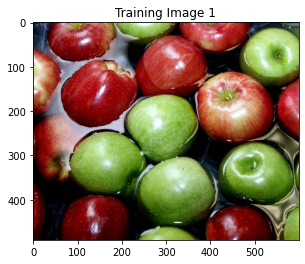

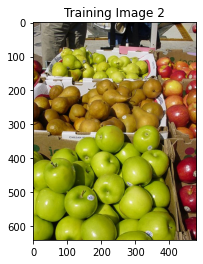

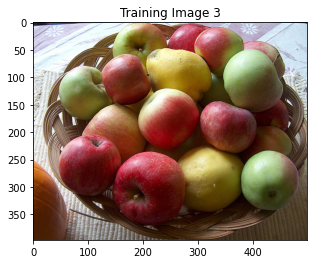

In [553]:
# You may want to use this or similar example code, for
#loading in your jpg’s and png’s:
import glob
import numpy as np
import matplotlib.pyplot as plt

files = glob.glob("apples/*.jpg")
print(files)
ColorImgs = []

for index, myFile in enumerate(files):
    im = plt.imread(myFile)
    ColorImgs.append(im)
    plt.imshow(im)
    plt.title(f"Training Image {index + 1}")
    plt.show()
    


['apples/bobbing-for-apples.png', 'apples/ApplesAndPears_by_srqpix_ClydeRobinson.png', 'apples/Apples_by_kightp_Pat_Knight_flickr.png']


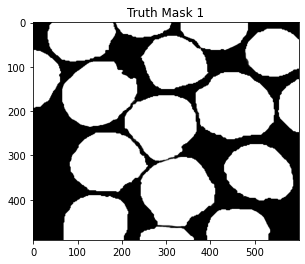

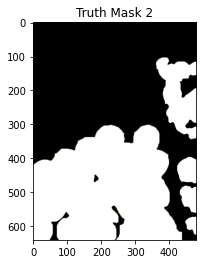

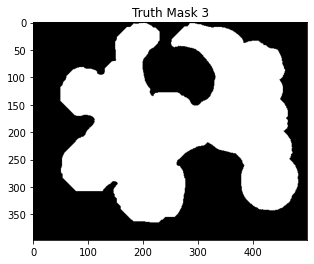

In [554]:
files_binary = glob.glob("apples/*.png")
print(files_binary)
ColorImgs_binary = []

for index, myFile in enumerate(files_binary):
    im = plt.imread(myFile)
    
    # Convert RGBA to grayscale by taking only one channel (e.g., red or alpha)
    if im.shape[2] == 4:  # RGBA image
        grayscale = im[:, :, 1]  # Using any of the RGB channels (first 3 channels where 4th is alpha channel)
        # I have chosen the 2nd (blue channel) arbitrarily
    else:  # RGB image
        grayscale = im[:, :, 0]  # Using the red channel
    
    # Threshold the grayscale image to create a binary mask
    binary_mask = (grayscale > 0.5).astype(float)  # Adjust threshold if necessary
    ColorImgs_binary.append(binary_mask)
    plt.imshow(im)
    plt.title(f"Truth Mask {index + 1}")
    plt.show()
    


    

# Copying in functions from PracticalMixGaussC to check that it works on 3D data before testing it on apple data:

In [555]:
import os 
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as spio
from scipy.stats import norm 
from scipy.stats import multivariate_normal
import time
import sys

flt_min = sys.float_info.min

%matplotlib inline

In [556]:
mixGaussTrue = dict()
mixGaussTrue['k'] = 3  # Number of Gaussian components
mixGaussTrue['d'] = 3  # Number of dimensions

# Weights for each Gaussian component
mixGaussTrue['weight'] = np.array([0.1309, 0.3966, 0.4725])

# Mean for each Gaussian component (3-dimensional, one column per component)
mixGaussTrue['mean'] = np.array([
    [4.0491, 4.8597, 6.5],
    [7.7578, 1.6335, 3.2],
    [11.9945, 8.9206, 5.4]
]).T  # Shape: (3, 3) -> each column is a mean vector

# Covariance matrices for each Gaussian component (3x3 for each component)
mixGaussTrue['cov'] = np.zeros(shape=(mixGaussTrue['d'], mixGaussTrue['d'], mixGaussTrue['k']))
mixGaussTrue['cov'][:, :, 0] = np.array([
    [4.2534, 0.4791, 0.2],
    [0.4791, 0.3522, 0.1],
    [0.2, 0.1, 1.5]
])
mixGaussTrue['cov'][:, :, 1] = np.array([
    [0.9729, 0.8723, 0.05],
    [0.8723, 2.6317, 0.3],
    [0.05, 0.3, 1.2]
])
mixGaussTrue['cov'][:, :, 2] = np.array([
    [0.9886, -1.2244, 0.0],
    [-1.2244, 3.0187, 0.25],
    [0.0, 0.25, 1.0]
])

In [557]:
def sampleFromDiscrete(probDist):     
    """
    Draws a random sample from a discrete probability distribution using a rejection sampling method.  
    
    Keyword arguments:
    probDist -- discrete probability ditrubtion to sample from.
    
    Returns: 
    r -- sampled point.
    """
    nIndex = len(probDist)                                                                 
    while True:                                                                            
        #choose random index                                                               
        r=int(np.floor(np.random.uniform()*nIndex))                                        
        #choose random height                                                              
        randHeight = np.random.uniform()                                                   
        #if height is less than probability value at this point in the                     
        # histogram then select                                                            
        if randHeight<probDist[r]:                                                         
            break                                                                          
    return r  

In [558]:
def getGaussian2SD(m,s,angle1):
    """
    Find position of in xy co-ordinates at 2SD out for a certain angle.
    """
  
    if s.shape[1] == 1:
        s = diag(s)

    vec = np.array([np.cos(angle1), np.sin(angle1)])
    
    factor = 4/(vec@np.linalg.inv(s)@vec.T)
    
    x = np.cos(angle1) * np.sqrt(factor)
    y = np.sin(angle1) * np.sqrt(factor)

    x = x + m[0]
    y = y + m[1]
                
    return x,y

In [559]:
def drawGaussianOutline(m,s,w):
    """
    Draw 2DGaussian
    """
    angleInc = 0.1    
    c = (0.9*(1-w), 0, 0)

    for cAngle in np.arange(0,2*np.pi,angleInc):         
        angle1 = cAngle
        angle2 = cAngle+angleInc
        x1, y1 = getGaussian2SD(m,s,angle1)
        x2, y2 = getGaussian2SD(m,s,angle2)
        plt.plot([x1, x2],[y1, y2],'-',linewidth=2,color=c)                 
    return

In [560]:
def drawEMData2d(data,mixGauss):
    """
    Plot the data plot the mixtures of Gaussian model, mixGauss, on top of it.
    
    Keyword arguments:
    data -- d by n matrix of data points.
    mixGauss -- dict with mixture of gaussian information.
    
    """
    #set(gcf,'Color',[1 1 1])
    plt.cla() 
    plt.plot(data[0,:],data[1,:],'k.')

    for cGauss in range(mixGauss['k']):
        drawGaussianOutline(mixGauss['mean'][:,cGauss],mixGauss['cov'][:,:,cGauss],mixGauss['weight'][cGauss])
    
    return     


In [561]:
def mixGaussGen(mixGauss, nData):                                                                              
    """
    Generates data from a d-dimensional mixture of Gaussians model. 
    
    Keyword arguments:
    mixGauss -- dict containing the mixture of gaussians arguments.
    nData -- number of data points to generate.
    
    Returns: 
    data -- d by nData, generated data points. 
    
    """
    # create space for output data                                                                               
    data = np.zeros(shape=(mixGauss['d'], nData))                                                                            
    # for each data point                                                                                        
    for cData in range(nData):                                                                                   
        # randomly choose Gaussian according to probability distributions                                        
        h = sampleFromDiscrete(mixGauss['weight'])                                                               
        # draw a sample from the appropriate Gaussian distribution  
        # first sample from the covariance matrix (google how to do this - it
        # will involve the numpy function np.linalg.cholesky().  Then add the mean vector
        # TO DO (f)- insert data generation code here  
        
        mean = mixGauss['mean'][:, h]
        cov = mixGauss['cov'][:, :, h]
        
        L = np.linalg.cholesky(cov)
        
        # Generate a sample from a standard normal distribution
        z = np.random.randn(mixGauss['d'])
        print(z)
        
        
    
        # Transform the sample to have the desired mean and covariance
        data[:, cData] = mean + L @ z  # Equivalent to mean + L * standard normal vector
                                                                                                           
    return data

In [562]:
#define number of samples to generate
nData = 400

#generate data from the mixture of Gaussians
#make sure you've filled in the routine above.
data = mixGaussGen(mixGaussTrue,nData)

#draw data, true Gaussians
#drawEMData2d(data,mixGaussTrue)

[-0.25344691  0.67913886  0.4255964 ]
[-0.07884492 -1.27859313  1.76614745]
[1.11928147 0.17273624 0.55676759]
[-0.01804856 -0.34832718  0.17849799]
[0.17071186 1.11689664 0.91247946]
[-1.16341949  0.12831044 -1.49718207]
[-0.48959613  0.96885627  0.68082009]
[-0.62502063  1.1837988   0.17279162]
[-1.0870913  -1.25799478 -0.73140343]
[-0.79198321 -1.71472127 -0.33359462]
[-0.93919769 -0.23801783  0.92502857]
[ 0.0019017  -0.06965865 -0.96631507]
[ 0.68222077  1.32715837 -0.38418267]
[ 1.91863794 -0.44831963  1.4312596 ]
[-0.1818224  -0.90184182 -0.4855482 ]
[0.34074807 0.82962734 1.33893897]
[ 3.62298066 -0.7707512  -0.22388823]
[-0.6069147  -1.40025107 -0.21921352]
[-0.84721409 -0.4111253   0.18938301]
[-0.19016301  0.00658842  0.90059531]
[-0.3546013   1.70676344 -0.65862484]
[ 0.8137034  -0.10595143  0.78582017]
[-0.66536226  0.20158806  0.03916562]
[-0.49862899 -0.77846273  0.0419976 ]
[-0.27764295 -1.70540273 -1.85424638]
[1.00721322 0.58277818 0.0242989 ]
[-0.66229894  1.05822285

In [563]:
def getGaussProb(x, mean, cov):
    """
    Compute the Gaussian likelihood for a data point x.
    
    Keyword arguments:
    x -- d-dimensional vector representing the data point.
    mean -- d-dimensional vector representing the mean of the Gaussian.
    cov -- d x d matrix representing the covariance matrix of the Gaussian.
    
    Returns:
    prob -- scalar representing the likelihood of the data point under the Gaussian.
    """
    d = len(x)  # Dimensionality of the data
    det_cov = np.linalg.det(cov)
    inv_cov = np.linalg.inv(cov)
    norm_const = 1 / np.sqrt((2 * np.pi) ** d * det_cov)
    diff = x - mean
    exponent = -0.5 * np.dot(np.dot(diff.T, inv_cov), diff)
    return norm_const * np.exp(exponent)

def getMixGaussLogLike(data, mixGaussEst): 
    """
    Calculate the log likelihood for the whole dataset under a mixture of Gaussians model.
    
    Keyword arguments:
    data -- d by n matrix containing data points.
    mixGaussEst -- dict containing the mixture of gaussians parameters.

    Returns: 
    logLike -- scalar containing the log likelihood.
    
    """
    
    data = np.atleast_2d(data)                                                                         
    # find total number of data items                                                                  
    nDims, nData = data.shape 
    nGauss = mixGaussEst['k']
    
    # initialize log likelihoods                                                                       
    logLike = 0                                                                                       
                                                                                                       
    # run through each data item                                                                       
    for cData in range(nData):                                                                         
        thisData = data[:, cData]                                                                      
        # TO DO - calculate likelihood of this data point under mixture of 
        
        like = 0
        
        for cGauss in range(nGauss):
            mean = mixGaussEst['mean'][:, cGauss]  # Mean of the current Gaussian
            cov = mixGaussEst['cov'][:, :, cGauss]  # Covariance of the current Gaussian
            weight = mixGaussEst['weight'][cGauss]  # Weight of the current Gaussian
            
            # Get the Gaussian probability for this data point under the cGauss-th component
            gaussProb = getGaussProb(thisData, mean, cov)
            
            # Add the weighted probability to the total likelihood for this data point
            like += weight * gaussProb
            
                    # Avoid log of zero or negative log likelihoods
        if like > 0:
            logLike += np.log(like)
        else:
            logLike += np.log(np.finfo(float).eps)  # Small epsilon to avoid log(0)
            #logLike += np.log(1e-80)
            
    return logLike.item()
            
                                                                        
                                                                      
                                                                                                       
       

In [564]:
import numpy as np
import time
import matplotlib.pyplot as plt

def fitMixGauss(data, k):
    """
    Estimate a k MoG model that would fit the data. Incremently plots the outcome.
    
    Keyword arguments:
    data -- d by n matrix containing data points.
    k -- scalar representing the number of Gaussians to use in the MoG model.
    
    Returns: 
    mixGaussEst -- dict containing the estimated MoG parameters.
    """
    
    # Number of dimensions and data points
    nDims, nData = data.shape

    # Initialize posterior responsibilities (hidden variables)
    postHidden = np.zeros(shape=(k, nData))

    # Initialize mixture of Gaussians parameters
    mixGaussEst = dict()
    mixGaussEst['d'] = nDims
    mixGaussEst['k'] = k
    mixGaussEst['weight'] = (1 / k) * np.ones(shape=(k))
    mixGaussEst['mean'] = 2 * np.random.randn(nDims, k)
    mixGaussEst['cov'] = np.zeros(shape=(nDims, nDims, k))
    for cGauss in range(k):
        mixGaussEst['cov'][:, :, cGauss] = 2.5 + 1.5 * np.random.uniform() * np.eye(nDims)
        
    # Calculate initial log likelihood
    logLike = getMixGaussLogLike(data, mixGaussEst)
    print('Log Likelihood Iter 0 : {:4.3f}\n'.format(logLike))

    # Number of iterations
    nIter = 30

    #fig, ax = plt.subplots(1, 1)
        
    # Start timer to estimate total time
    start_time = time.time()

    for cIter in range(nIter):
        # ===================== =====================
        # Expectation step
        # ===================== =====================
        for cData in range(nData):
            thisData = data[:, cData]

            # Calculate posterior probability (responsibility) for each Gaussian component
            totalProb = 0
            for cGauss in range(k):
                mean = mixGaussEst['mean'][:, cGauss]
                cov = mixGaussEst['cov'][:, :, cGauss]
                weight = mixGaussEst['weight'][cGauss]

                # Gaussian probability for this data point under the current component
                gaussProb = getGaussProb(thisData, mean, cov)
                postHidden[cGauss, cData] = weight * gaussProb
                totalProb += postHidden[cGauss, cData]
                
            if totalProb > 0:
                postHidden[:, cData] /= totalProb
            else:
                postHidden[:, cData] = np.ones(k) / k  # Distribute equally if totalProb is zero
            
            # Normalize responsibilities for this data point
            #postHidden[:, cData] /= totalProb

        # ===================== =====================
        # Maximization Step
        # ===================== =====================
        # Update the parameters for each Gaussian component
        for cGauss in range(k):
            # Total responsibility for the current component
            respSum = np.sum(postHidden[cGauss, :])

            # Update weights (mixing coefficients)
            mixGaussEst['weight'][cGauss] = respSum / nData

            # Update means
            weightedSum = np.dot(data, postHidden[cGauss, :].T)
            mixGaussEst['mean'][:, cGauss] = weightedSum / respSum

            # Update covariances
            covSum = np.zeros((nDims, nDims))
            for cData in range(nData):
                diff = (data[:, cData] - mixGaussEst['mean'][:, cGauss]).reshape(-1, 1)
                covSum += postHidden[cGauss, cData] * (diff @ diff.T)
            mixGaussEst['cov'][:, :, cGauss] = covSum / respSum

        # Draw the updated model
#         drawEMData2d(data, mixGaussEst)
#         time.sleep(0.7)
#         fig.canvas.draw()

        # Calculate log likelihood
        logLike = getMixGaussLogLike(data, mixGaussEst)
        print('Log Likelihood After Iter {} : {:4.3f}\n'.format(cIter, logLike))
        
        # Estimate and print remaining time
        elapsed_time = time.time() - start_time  # Time elapsed so far
        avg_time_per_iter = elapsed_time / (cIter + 1)  # Average time per iteration
        remaining_iters = nIter - (cIter + 1)  # Remaining iterations
        remaining_time = avg_time_per_iter * remaining_iters  # Estimated remaining time

        # Print estimated time remaining in seconds
        print(f"Estimated time remaining: {remaining_time:4.2f} seconds")

    return mixGaussEst


In [565]:
#define number of components to estimate
nGaussEst = 3

#fit mixture of Gaussians (Pretend someone handed you some data. Now what?)
#TO DO fill in this routine (below)
mixGaussEst = fitMixGauss(data,nGaussEst)

Log Likelihood Iter 0 : -6074.335

Log Likelihood After Iter 0 : -2521.799

Estimated time remaining: 2.36 seconds
Log Likelihood After Iter 1 : -2423.071

Estimated time remaining: 2.22 seconds
Log Likelihood After Iter 2 : -2285.773

Estimated time remaining: 2.76 seconds
Log Likelihood After Iter 3 : -2226.960

Estimated time remaining: 2.69 seconds
Log Likelihood After Iter 4 : -2201.672

Estimated time remaining: 2.59 seconds
Log Likelihood After Iter 5 : -2191.158

Estimated time remaining: 2.67 seconds
Log Likelihood After Iter 6 : -2190.780

Estimated time remaining: 2.63 seconds
Log Likelihood After Iter 7 : -2190.746

Estimated time remaining: 2.51 seconds
Log Likelihood After Iter 8 : -2190.742

Estimated time remaining: 2.42 seconds
Log Likelihood After Iter 9 : -2190.742

Estimated time remaining: 2.27 seconds
Log Likelihood After Iter 10 : -2190.742

Estimated time remaining: 2.11 seconds
Log Likelihood After Iter 11 : -2190.742

Estimated time remaining: 1.95 seconds
Log

In [566]:
print("The parameters of mixGaussEst:", mixGaussEst)

The parameters of mixGaussEst: {'d': 3, 'k': 3, 'weight': array([0.4323916 , 0.41569103, 0.15191737]), 'mean': array([[11.94681205,  7.91779406,  3.9276991 ],
       [ 9.1022709 ,  1.61816101,  4.85340741],
       [ 5.45180607,  3.1190464 ,  6.57590099]]), 'cov': array([[[ 1.04863587,  0.92812805,  4.09067216],
        [-1.32670169,  0.83609896,  0.63410759],
        [ 0.08652235,  0.10260855, -0.01909026]],

       [[-1.32670169,  0.83609896,  0.63410759],
        [ 3.05811275,  2.53595298,  0.32281942],
        [-0.08270498,  0.3022147 , -0.02429722]],

       [[ 0.08652235,  0.10260855, -0.01909026],
        [-0.08270498,  0.3022147 , -0.02429722],
        [ 0.91699846,  1.09125783,  1.73420281]]])}


# End of Practical Mix Gauss C:

# Step 1: 

## Storing apple pixels and non-apple pixels in separate lists: 

In [55]:
# Initialize lists to store apple and non-apple pixels across all images
all_apple_pixels = []
all_non_apple_pixels = []

# Loop over each color image and its corresponding binary mask
for color_img, binary_mask in zip(ColorImgs, ColorImgs_binary):
    # Ensure the mask dimensions match the color image dimensions
    assert color_img.shape[:2] == binary_mask.shape, "Image and mask dimensions must match."
    
    # Extract apple pixels (where mask is 1)
    apple_pixels = color_img[binary_mask == 1]
    all_apple_pixels.append(apple_pixels)
    
    # Extract non-apple pixels (where mask is 0)
    non_apple_pixels = color_img[binary_mask == 0]
    all_non_apple_pixels.append(non_apple_pixels)
    
print(all_apple_pixels[2])
apple_pixels_1 = all_apple_pixels[0]
apple_pixels_2 = all_apple_pixels[1]
apple_pixels_3 = all_apple_pixels[2]


# Combine all pixels from different images into single arrays
all_apple_pixels = np.vstack(all_apple_pixels)
all_non_apple_pixels = np.vstack(all_non_apple_pixels)

[[239 199 173]
 [236 196 161]
 [229 188 156]
 ...
 [ 46   3  10]
 [ 45   3   7]
 [ 45   3   5]]


In [568]:

apple_data = all_apple_pixels.T  # Shape: (3, num_apple_pixels)
non_apple_data = all_non_apple_pixels.T  # Shape: (3, num_non_apple_pixels)
print()
print(apple_data)
print(f"Shape of apple data : {apple_data.shape}")
print(non_apple_data)
print(f"Shape of non-apple data : {non_apple_data.shape}")

combined_data = np.hstack((apple_data, non_apple_data))
print(combined_data.shape)

k = 2

apple_mog_model = fitMixGauss(combined_data, k)





[[51 66 77 ... 46 45 45]
 [ 3  8  9 ...  3  3  3]
 [15 20 22 ... 10  7  5]]
Shape of apple data : (3, 425703)
[[20 17 15 ... 61 59 64]
 [32 29 29 ... 49 46 51]
 [56 55 55 ... 33 29 32]]
Shape of non-apple data : (3, 374597)
(3, 800300)
Log Likelihood Iter 0 : -54346915.158

Log Likelihood After Iter 0 : -12864427.971

Estimated time remaining: 2387.21 seconds
Log Likelihood After Iter 1 : -12861756.245

Estimated time remaining: 2281.87 seconds
Log Likelihood After Iter 2 : -12856682.903

Estimated time remaining: 2194.23 seconds
Log Likelihood After Iter 3 : -12840376.993

Estimated time remaining: 2111.67 seconds
Log Likelihood After Iter 4 : -12792244.519

Estimated time remaining: 2034.64 seconds
Log Likelihood After Iter 5 : -12700776.519

Estimated time remaining: 1958.21 seconds
Log Likelihood After Iter 6 : -12608014.656

Estimated time remaining: 1881.14 seconds
Log Likelihood After Iter 7 : -12548518.812

Estimated time remaining: 1797.67 seconds
Log Likelihood After Iter 8 

In [505]:
apple_mog_model_onlyapples_k2 = fitMixGauss(apple_data, 2)
apple_mog_model_noapples_k2 = fitMixGauss(non_apple_data, 2)


Log Likelihood Iter 0 : -22099322.038

Log Likelihood After Iter 0 : -6792425.324

Estimated time remaining: 1272.29 seconds
Log Likelihood After Iter 1 : -6788887.206

Estimated time remaining: 1221.89 seconds
Log Likelihood After Iter 2 : -6776453.624

Estimated time remaining: 1169.10 seconds
Log Likelihood After Iter 3 : -6745785.755

Estimated time remaining: 1116.93 seconds
Log Likelihood After Iter 4 : -6702899.482

Estimated time remaining: 1081.12 seconds
Log Likelihood After Iter 5 : -6665611.662

Estimated time remaining: 1035.83 seconds
Log Likelihood After Iter 6 : -6643725.733

Estimated time remaining: 988.66 seconds
Log Likelihood After Iter 7 : -6634204.883

Estimated time remaining: 943.09 seconds
Log Likelihood After Iter 8 : -6629811.914

Estimated time remaining: 899.40 seconds
Log Likelihood After Iter 9 : -6626362.283

Estimated time remaining: 854.95 seconds
Log Likelihood After Iter 10 : -6622663.565

Estimated time remaining: 810.73 seconds
Log Likelihood Afte

In [506]:
apple_mog_model_onlyapples_k3 = fitMixGauss(apple_data, 3)
apple_mog_model_noapples_k3 = fitMixGauss(non_apple_data, 3)

Log Likelihood Iter 0 : -24713842.943

Log Likelihood After Iter 0 : -6790154.284

Estimated time remaining: 1821.31 seconds
Log Likelihood After Iter 1 : -6781311.396

Estimated time remaining: 1748.71 seconds
Log Likelihood After Iter 2 : -6757848.394

Estimated time remaining: 1687.78 seconds
Log Likelihood After Iter 3 : -6718259.577

Estimated time remaining: 1621.79 seconds
Log Likelihood After Iter 4 : -6677695.012

Estimated time remaining: 6287.32 seconds
Log Likelihood After Iter 5 : -6650102.598

Estimated time remaining: 11471.32 seconds
Log Likelihood After Iter 6 : -6634830.645

Estimated time remaining: 9625.74 seconds
Log Likelihood After Iter 7 : -6624440.542

Estimated time remaining: 8225.62 seconds
Log Likelihood After Iter 8 : -6612106.626

Estimated time remaining: 7124.86 seconds
Log Likelihood After Iter 9 : -6598156.568

Estimated time remaining: 6231.28 seconds
Log Likelihood After Iter 10 : -6587548.329

Estimated time remaining: 5489.37 seconds
Log Likelihoo

In [507]:
apple_mog_model_onlyapples_k4 = fitMixGauss(apple_data, 4)
apple_mog_model_noapples_k4 = fitMixGauss(non_apple_data, 4)

Log Likelihood Iter 0 : -22974146.968

Log Likelihood After Iter 0 : -6792557.717

Estimated time remaining: 2401.70 seconds
Log Likelihood After Iter 1 : -6788888.489

Estimated time remaining: 2297.91 seconds
Log Likelihood After Iter 2 : -6776288.022

Estimated time remaining: 2202.29 seconds
Log Likelihood After Iter 3 : -6745412.600

Estimated time remaining: 2120.47 seconds
Log Likelihood After Iter 4 : -6701884.593

Estimated time remaining: 2042.41 seconds
Log Likelihood After Iter 5 : -6663258.359

Estimated time remaining: 1957.21 seconds
Log Likelihood After Iter 6 : -6638672.335

Estimated time remaining: 5157.96 seconds
Log Likelihood After Iter 7 : -6624211.287

Estimated time remaining: 4539.00 seconds
Log Likelihood After Iter 8 : -6611837.486

Estimated time remaining: 4040.96 seconds
Log Likelihood After Iter 9 : -6596708.512

Estimated time remaining: 3625.34 seconds
Log Likelihood After Iter 10 : -6577772.851

Estimated time remaining: 3270.68 seconds
Log Likelihood

In [508]:
apple_mog_model_onlyapples_k5 = fitMixGauss(apple_data, 5)
apple_mog_model_noapples_k5 = fitMixGauss(non_apple_data, 5)

Log Likelihood Iter 0 : -23608240.543

Log Likelihood After Iter 0 : -6789270.351

Estimated time remaining: 3091.00 seconds
Log Likelihood After Iter 1 : -6778437.512

Estimated time remaining: 2970.32 seconds
Log Likelihood After Iter 2 : -6752563.353

Estimated time remaining: 2863.19 seconds
Log Likelihood After Iter 3 : -6711516.691

Estimated time remaining: 2757.60 seconds
Log Likelihood After Iter 4 : -6668352.935

Estimated time remaining: 2645.99 seconds
Log Likelihood After Iter 5 : -6632879.489

Estimated time remaining: 2529.56 seconds
Log Likelihood After Iter 6 : -6609218.084

Estimated time remaining: 2421.56 seconds
Log Likelihood After Iter 7 : -6597960.143

Estimated time remaining: 2317.06 seconds
Log Likelihood After Iter 8 : -6591231.364

Estimated time remaining: 2213.32 seconds
Log Likelihood After Iter 9 : -6585087.367

Estimated time remaining: 2101.26 seconds
Log Likelihood After Iter 10 : -6576751.152

Estimated time remaining: 1991.52 seconds
Log Likelihood

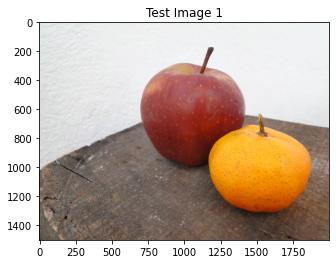

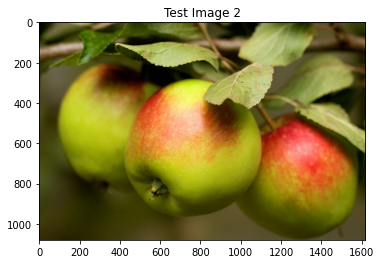

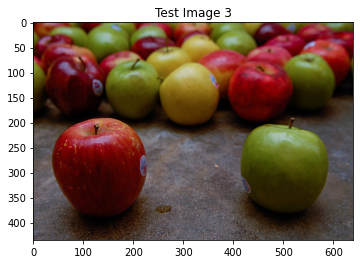

In [487]:
files_test = glob.glob("testapples/*.jpg")

ColorImgs_test = []

for index, myFile in enumerate(files_test):
    im = plt.imread(myFile)
    ColorImgs_test.append(im)
    plt.imshow(im)
    plt.title(f"Test Image {index + 1}")
    plt.show()
    

# reshaping data so it is in correct format for posterior probabilities to be calculated:     
image_1_test = ColorImgs_test[0].reshape(-1, 3)
image_1_test = image_1_test.T

image_2_test = ColorImgs_test[1].reshape(-1, 3)
image_2_test = image_2_test.T

image_3_test = ColorImgs_test[2].reshape(-1, 3)
image_3_test = image_3_test.T


In [287]:
def getPosteriorProbabilities(data, mixGaussEst):
    """
    Calculate the posterior probabilities (responsibilities) for each data point 
    under the mixture of Gaussians model.
    
    Keyword arguments:
    data -- d by n matrix containing test data points (nData x nDims).
    mixGaussEst -- dict containing the trained mixture of Gaussians parameters.

    Returns: 
    postHidden -- nGauss by nData matrix of posterior probabilities (responsibilities).
    """
    nDims, nData = data.shape  # nDims is the number of dimensions, nData is the number of test data points
    nGauss = mixGaussEst['k']  # number of Gaussians in the mixture
    
    postHidden = np.zeros((nGauss, nData))  # Initialize the posterior probabilities (responsibilities)
    
    # Loop through each data point
    for cData in range(nData):
        thisData = data[:, cData]  # Current data point
        
        totalProb = 0  # To store the sum of weighted Gaussian likelihoods
        
        # Compute the likelihood of the data point under each Gaussian component
        for cGauss in range(nGauss):
            mean = mixGaussEst['mean'][:, cGauss]
            cov = mixGaussEst['cov'][:, :, cGauss]
            weight = mixGaussEst['weight'][cGauss]
            
            # Compute the Gaussian likelihood for this data point under the current component
            gaussProb = getGaussProb(thisData, mean, cov)
            
            # Add to the total probability (weighted likelihood)
            totalProb += weight * gaussProb
            postHidden[cGauss, cData] = weight * gaussProb  # Store the weighted likelihood for the current component
        
        # Normalize the responsibilities to get the posterior probabilities
        if totalProb > 0:
            postHidden[:, cData] /= totalProb
        else:
            postHidden[:, cData] = np.ones(nGauss) / nGauss  # In case totalProb is zero (assign equal responsibility)
            
        # Print progress every 10%
        if (cData + 1) % (nData // 10) == 0:
            print(f"Progress: {((cData + 1) / nData) * 100:.2f}%")
    
    return postHidden

In [569]:
import numpy as np
import matplotlib.pyplot as plt

def compute_metrics(pred_mask, true_mask):
    """
    Compute the confusion matrix metrics: TP, TN, FP, FN.
    
    Keyword arguments:
    pred_mask -- Binary predicted mask.
    true_mask -- Binary ground truth mask.
    
    Returns:
    TP, TN, FP, FN
    """
    TP = np.sum((pred_mask == 1) & (true_mask == 1))  # True Positives
    #print(" True Positive:", TP)
    TN = np.sum((pred_mask == 0) & (true_mask == 0))  # True Negatives
    #print(" True Negative:" ,TN)
    FP = np.sum((pred_mask == 1) & (true_mask == 0))  # False Positives
    #print("False Positive:", FP)
    FN = np.sum((pred_mask == 0) & (true_mask == 1))  # False Negatives
    #print("False Negative:", FN)
    return TP, TN, FP, FN

def calculate_roc(true_mask, posterior_probs, thresholds):
    """
    Compute the ROC curve data (TPR, FPR) at specified thresholds.
    
    Keyword arguments:
    true_mask -- Binary ground truth mask.
    posterior_probs -- Posterior probability heatmap for the prediction.
    thresholds -- List or array of thresholds for classification.
    
    Returns:
    fpr, tpr
    """
    # Flatten the true mask and posterior probabilities for easier computation
    true_mask_flat = true_mask.flatten()
    posterior_probs_flat = posterior_probs.flatten()

    fpr = []
    tpr = []

    # Calculate TPR and FPR for each provided threshold
    for threshold in thresholds:
        # Create the predicted mask by thresholding the posterior probabilities
        pred_mask = (posterior_probs_flat >= threshold).astype(int)

        # Compute confusion matrix metrics
        TP, TN, FP, FN = compute_metrics(pred_mask, true_mask_flat)

        # Calculate TPR and FPR
        tpr_value = TP / (TP + FN) if (TP + FN) > 0 else 0  # Handle division by zero (v. unlikely but still included for completeness)
        fpr_value = FP / (FP + TN) if (FP + TN) > 0 else 0  # Handle division by zero (v. unlikely but still included for completeness)

        tpr.append(tpr_value)
        fpr.append(fpr_value)
        
    auc_score = -np.trapz(tpr, fpr)  # Approximate the AUC via the trapezoidal rule

    return np.array(fpr), np.array(tpr), auc_score

def plot_roc(fpr, tpr, auc_score, component):
    """
    Plot the ROC curve from the computed TPR and FPR values.
    
    Keyword arguments:
    fpr -- False Positive Rate values.
    tpr -- True Positive Rate values.
    """
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {auc_score:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f"Receiver Operating Characteristic (ROC): Gaussian Component {component}")
    plt.legend(loc="lower right")
    plt.show()



def reshape_and_plotposteriors(file, PosteriorProb, subplot_titles=None, figure_title=None):
    """
    Reshapes and plots the posterior probabilities for each Gaussian component as a subplot.
    
    Keyword arguments:
    file -- The image file used for reshaping the posterior probabilities.
    PosteriorProb -- List of posterior probabilities for each Gaussian component.
    subplot_titles -- List of titles for each subplot. If None, default titles will be used.
    figure_title -- Custom title for the entire figure. If None, a default title will be used.
    """
    im = plt.imread(file)  # Read the image
    s1, s2, s3 = im.shape  # Get the image dimensions
    
    # Create subplots: Assume we want to display all PosteriorProb in a single row
    n_plots = len(PosteriorProb)
    n_cols = 3  # Set number of columns for the subplot grid (can be adjusted)
    n_rows = (n_plots // n_cols) + (1 if n_plots % n_cols != 0 else 0)  # Calculate number of rows needed
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))  # Create subplots grid
    axes = axes.flatten()  # Flatten to make indexing easier
    
    # Set the figure title if provided
    if figure_title:
        fig.suptitle(figure_title, fontsize=16)
    
    # Plot each posterior probability on the subplots
    for i in range(n_plots): 
        PosteriorProb_k = PosteriorProb[i]
        PosteriorProb_k_reshaped = PosteriorProb_k.reshape((s1, s2))  # Reshape to match image size
        
        ax = axes[i]  # Get the axis for the current subplot
        
        im = ax.imshow(PosteriorProb_k_reshaped, cmap='viridis', aspect='auto')
        ax.set_title(subplot_titles[i] if subplot_titles else f"Gaussian Component {i + 1}")
        ax.set_xlabel("Width")
        ax.set_ylabel("Height")
        
        # Add colorbar
        fig.colorbar(im, ax=ax, orientation='vertical', label='Posterior Probability')
    
    # Hide unused axes if there are any
    for i in range(n_plots, len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()  # Adjust spacing between subplots
    plt.subplots_adjust(top=0.9)  # Adjust the top margin to fit the figure title
    plt.show()
    
def calculate_and_plot(mask, postprob, thresholds, component): 
    """
    
    Calculates the fpr, tpr, and auc score for a set of posterior probabilities 
    and its corresponding truth mask and custom thresholds. Then proceeds to plot the ROC curve. 
    
    
    
    
    Keyword arguments:
    mask -- The truth mask needed to calculate fpr, tpr, and auc score. 
    postprob -- List of posterior probabilities.
    thresholds -- List or array of thresholds for classification.
    component -- The specific gaussian component of the MoG model. 
    """
    
    fpr, tpr, auc_score = calculate_roc(mask, postprob, thresholds)
    plot_roc(fpr, tpr, auc_score, component)


### Loading in ground truth mask of test apples: 

[array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])]


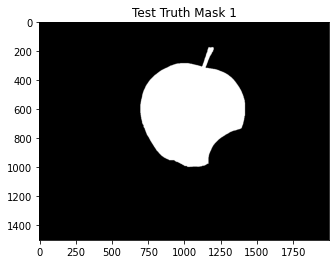

In [510]:
files_binary_test = glob.glob("testApples/*.png")
ColorImgs_binary_test = []

for index, myFile in enumerate(files_binary_test):
    im = plt.imread(myFile)
    
    # Convert RGBA to grayscale by taking only one channel (e.g., red or alpha)
    if im.shape[2] == 4:  # RGBA image
        grayscale = im[:, :, 1]  # Using any of the RGB channels (first 3 channels where 4th is alpha channel)
        # I have chosen the 2nd (blue channel) arbitrarily
    else:  # RGB image
        grayscale = im[:, :, 0]  # Using the red channel
    
    # Threshold the grayscale image to create a binary mask
    binary_mask = (grayscale > 0.5).astype(float)  # Adjust threshold if necessary
    ColorImgs_binary_test.append(binary_mask)
    plt.imshow(im)
    plt.title(f"Test Truth Mask {index + 1}")

# Print out the binary masks to confirm
print(ColorImgs_binary_test)


# Producing sets of TP, TN, FP, and FN: 

In [210]:
### Checking binary mask and predicted mask is in correct shape: 
binary_test = ColorImgs_binary_test[0]
print(binary_test)



[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]



# Loading in downloaded Test Images off internet: 


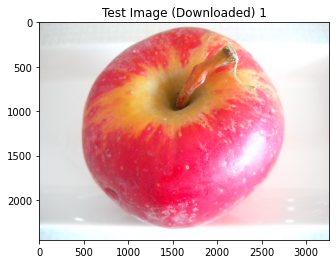

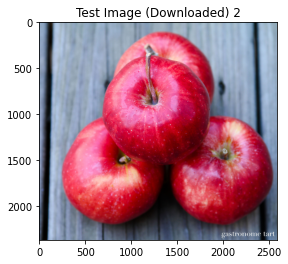

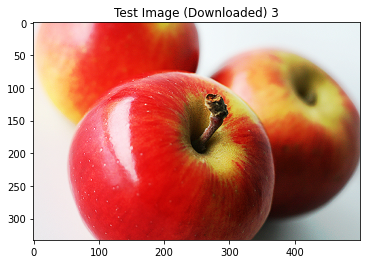

In [491]:
files_downloaded_test = glob.glob("downloadedApples/*.jpg")

ColorImgs_downloaded_test = []

for index, myFile in enumerate(files_downloaded_test):
    im = plt.imread(myFile)
    ColorImgs_downloaded_test.append(im)
    plt.imshow(im)
    plt.title(f"Test Image (Downloaded) {index + 1}")
    plt.show()

#Reshaping data once again so data is in correct format for posterior probabilities to be calculated:
downloaded_image_1 = ColorImgs_downloaded_test[0].reshape(-1, 3)
downloaded_image_1 = downloaded_image_1.T

downloaded_image_2 = ColorImgs_downloaded_test[1].reshape(-1, 3)
downloaded_image_2 = downloaded_image_2.T

downloaded_image_3 = ColorImgs_downloaded_test[2].reshape(-1, 3)
downloaded_image_3 = downloaded_image_3.T





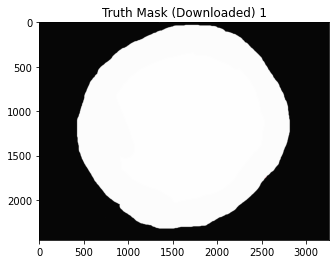

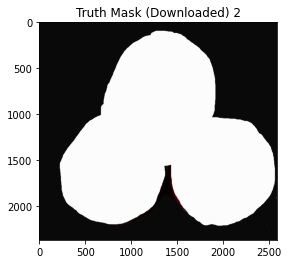

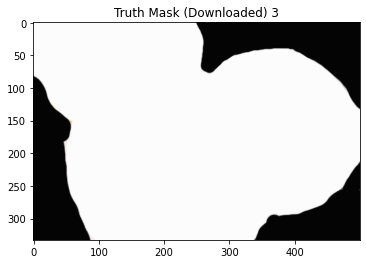

In [496]:
files_downloaded_groundtruth = glob.glob("downloadedApples/*.png")

ColorImgs_downloaded_groundtruth = []

for index, myFile in enumerate(files_downloaded_groundtruth):
    
    im = plt.imread(myFile)
    
    # Convert RGBA to grayscale by taking only one channel (e.g., red or alpha)
    if im.shape[2] == 4:  # RGBA image
        grayscale = im[:, :, 1]  # Using any of the RGB channels (first 3 channels where 4th is alpha channel)
        # I have chosen the 2nd (blue channel) arbitrarily
    else:  # RGB image
        grayscale = im[:, :, 0]  # Using the red channel
             
    # Threshold the grayscale image to create a binary mask
    binary_mask = (grayscale > 0.5).astype(float)  # Adjust threshold if necessary (0.5 used here)
    ColorImgs_downloaded_groundtruth.append(binary_mask)
    
    
i1 = plt.imread(files_downloaded_groundtruth[2])
plt.imshow(i1)
plt.title("Truth Mask (Downloaded) 1")
plt.show()

i2 = plt.imread(files_downloaded_groundtruth[0])
plt.imshow(i2)
plt.title("Truth Mask (Downloaded) 2")
plt.show()

i3 = plt.imread(files_downloaded_groundtruth[1])
plt.imshow(i3)
plt.title("Truth Mask (Downloaded) 3")
plt.show()
    



# N.B. 

I have had to manually plot each truth mask instead of in the loop as before. This is because the order of the truth masks does not match the order of the images. 

In [511]:
custom_thresholds = np.linspace(0,1, 1000)

true_mask1 = ColorImgs_downloaded_groundtruth[2]
true_mask1 = true_mask1.flatten()

true_mask2 = ColorImgs_downloaded_groundtruth[0]
true_mask2 = true_mask2.flatten()

true_mask3 = ColorImgs_downloaded_groundtruth[1]
true_mask3 = true_mask3.flatten()





# MoG Model using the truth masks: 

In [515]:
postprob_G2_TestImage1_onlyapple = getPosteriorProbabilities(image_1_test, apple_mog_model_onlyapples_k2)
postprob_G2_TestImage2_onlyapple = getPosteriorProbabilities(image_2_test, apple_mog_model_onlyapples_k2)
postprob_G2_TestImage3_onlyapple = getPosteriorProbabilities(image_3_test, apple_mog_model_onlyapples_k2)


Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


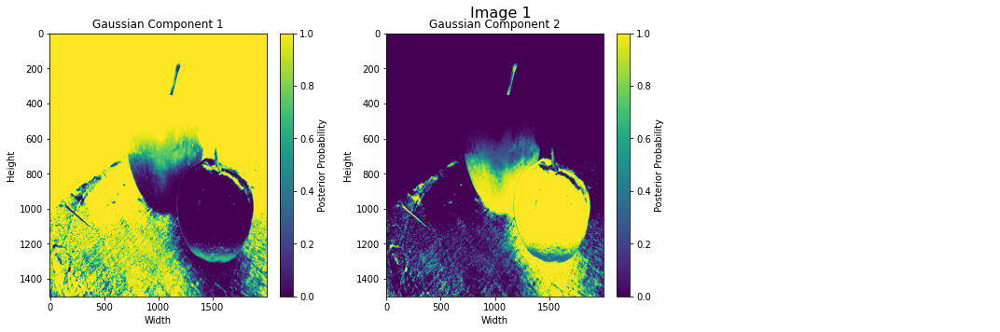

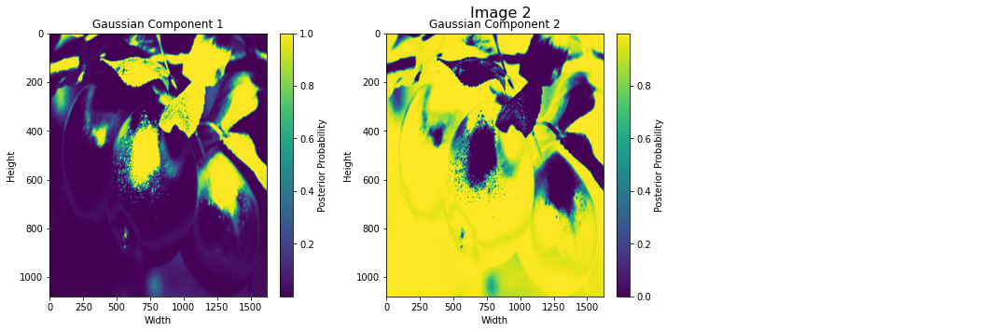

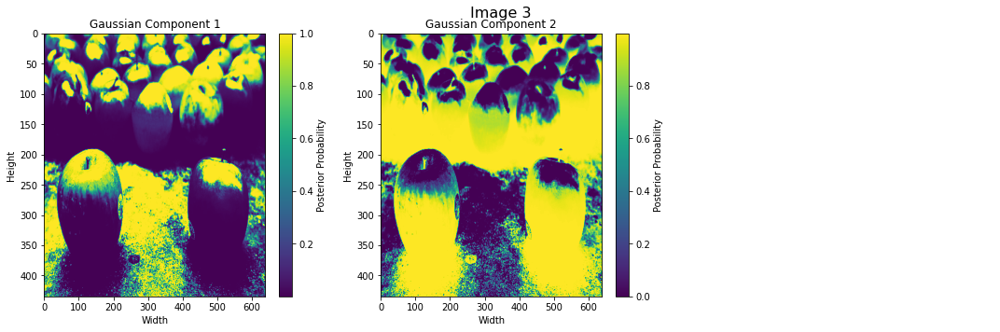

In [516]:
reshape_and_plotposteriors(files_test[0],postprob_G2_TestImage1_onlyapple, figure_title =  "Image 1")
reshape_and_plotposteriors(files_test[1],postprob_G2_TestImage2_onlyapple, figure_title =  "Image 2") 
reshape_and_plotposteriors(files_test[2],postprob_G2_TestImage3_onlyapple, figure_title =  "Image 3")

## Comments on plots: 

This is the posterior probalities of the test images given when using the 2 gaussian MoG model which was trained on only apple pixels (separated using the truth masks given in the training set). 

This struggles in differentiating apples from the background, suggesting that more gaussian components may be needed. 


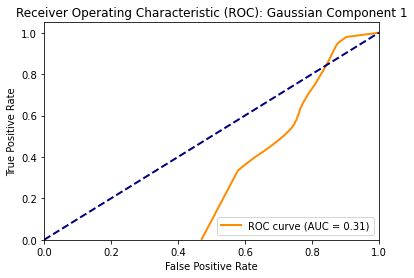

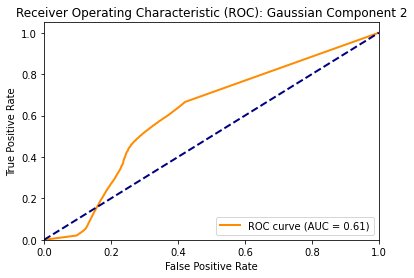

In [517]:
calculate_and_plot(true_mask, postprob_G2_TestImage1_onlyapple[0], custom_thresholds, 1)
calculate_and_plot(true_mask, postprob_G2_TestImage1_onlyapple[1], custom_thresholds, 2)

## Comments on plots: 

The struggle of this model is reflected in the poor AUC scores above.Gaussian Component 2 (which has seemed to attribute high posteriors more to the orange than the apple) is barely better than a random classifier (the blue line) with an AUC score of only 0.61. 



In [518]:
postprob_G3_TestImage1_onlyapple = getPosteriorProbabilities(image_1_test, apple_mog_model_onlyapples_k3)
postprob_G3_TestImage2_onlyapple = getPosteriorProbabilities(image_2_test, apple_mog_model_onlyapples_k3)
postprob_G3_TestImage3_onlyapple = getPosteriorProbabilities(image_3_test, apple_mog_model_onlyapples_k3)

Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


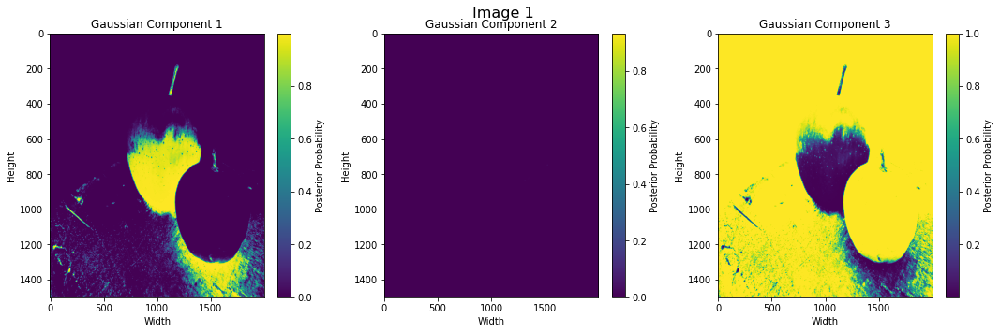

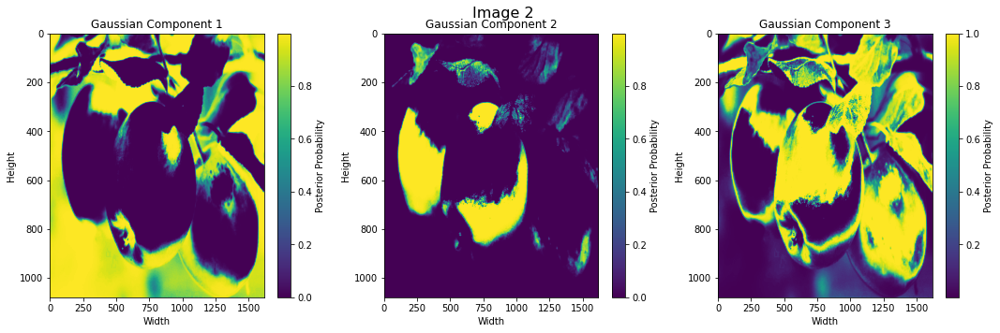

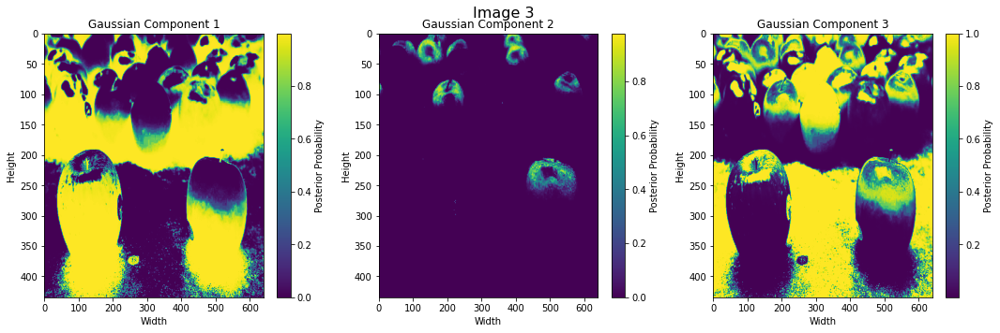

In [519]:
reshape_and_plotposteriors(files_test[0],postprob_G3_TestImage1_onlyapple, figure_title =  "Image 1")
reshape_and_plotposteriors(files_test[1],postprob_G3_TestImage2_onlyapple, figure_title =  "Image 2") 
reshape_and_plotposteriors(files_test[2],postprob_G3_TestImage3_onlyapple, figure_title =  "Image 3")

# Comments on plots: 

Gaussian Component 1 seems to identify the apple to a decent extent. However, in image 2 and 3 (which is more complicated as there is not just an orange, an apple, and a distinct table and white background), it fails to identify the apples. 

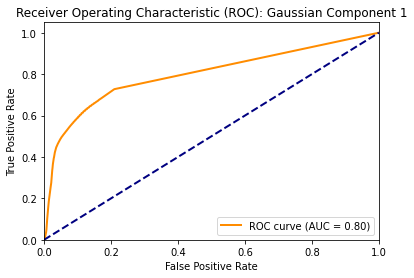

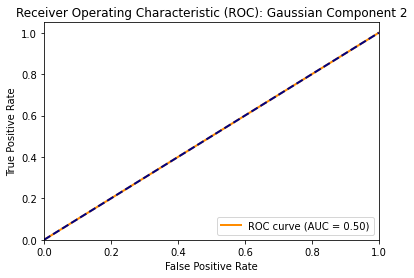

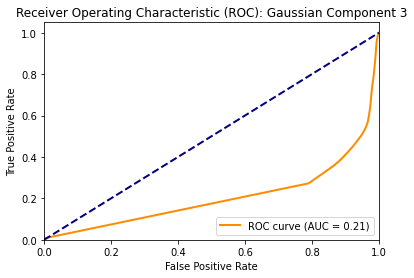

In [520]:
calculate_and_plot(true_mask, postprob_G3_TestImage1_onlyapple[0], custom_thresholds, 1)
calculate_and_plot(true_mask, postprob_G3_TestImage1_onlyapple[1], custom_thresholds, 2)
calculate_and_plot(true_mask, postprob_G3_TestImage1_onlyapple[2], custom_thresholds, 3)

## Comments on plots: 

As this is testing on test image 1 and gaussian component 1 identifies the apple well as shown in the posterior plots above, the AUC is adeqaute for component 1 at 0.80. However, I suspect this would not be as good for image 2 and 3 as the posteriors for each component are less promising as shown above.


In [521]:
postprob_G4_TestImage1_onlyapple = getPosteriorProbabilities(image_1_test, apple_mog_model_onlyapples_k4)
postprob_G4_TestImage2_onlyapple = getPosteriorProbabilities(image_2_test, apple_mog_model_onlyapples_k4)
postprob_G4_TestImage3_onlyapple = getPosteriorProbabilities(image_3_test, apple_mog_model_onlyapples_k4)

Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


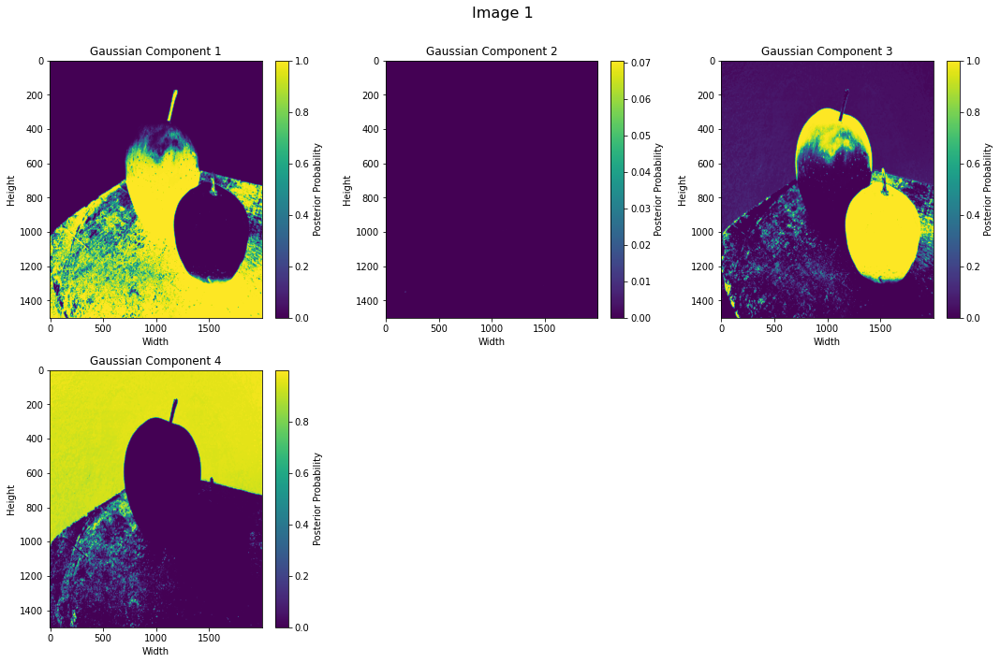

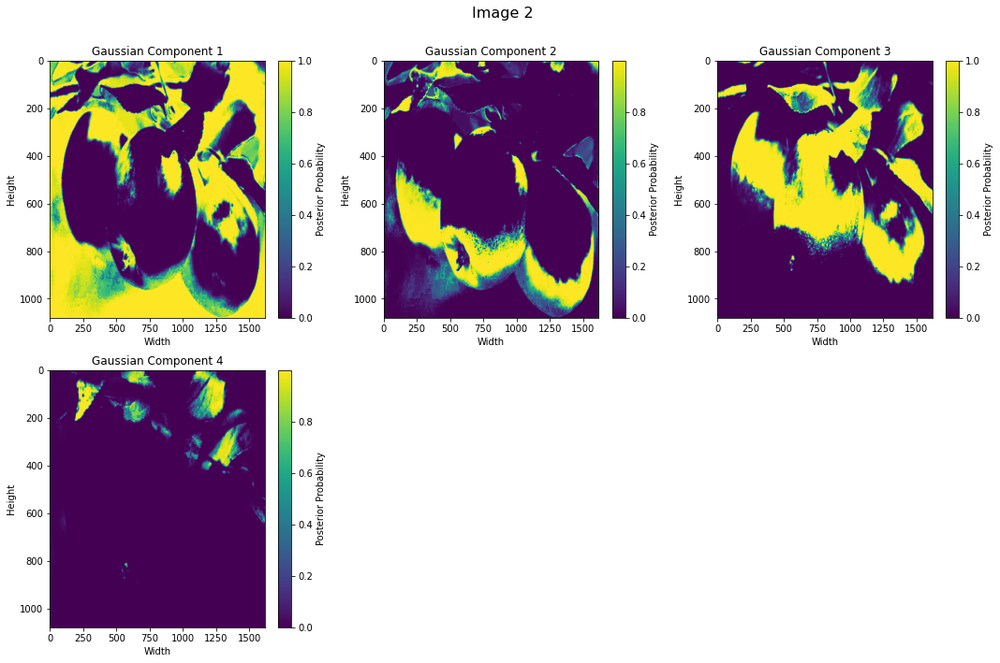

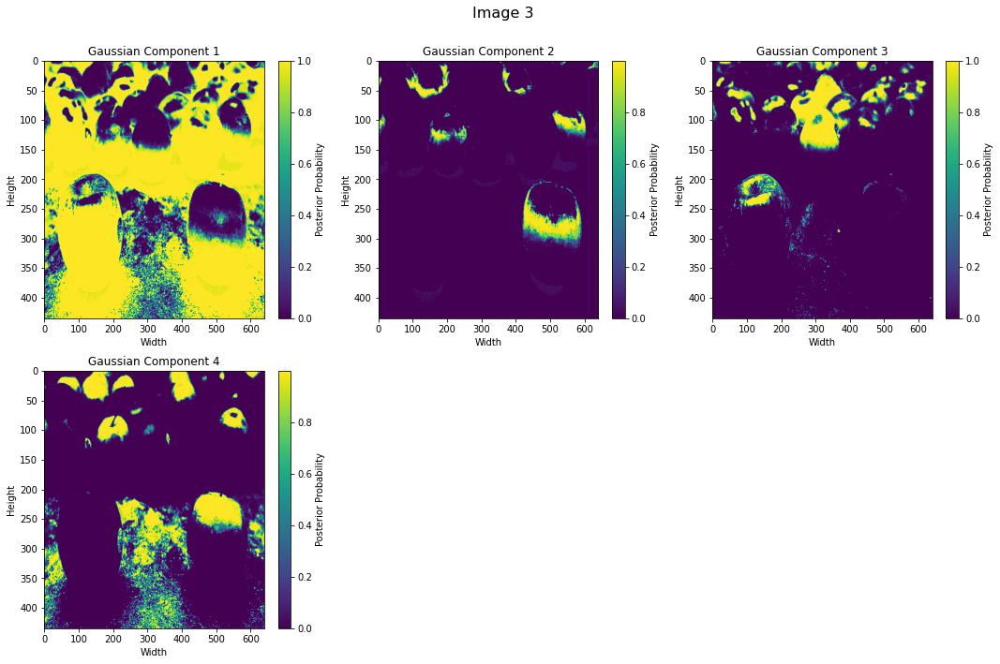

In [522]:
reshape_and_plotposteriors(files_test[0],postprob_G4_TestImage1_onlyapple, figure_title =  "Image 1")
reshape_and_plotposteriors(files_test[1],postprob_G4_TestImage2_onlyapple, figure_title =  "Image 2") 
reshape_and_plotposteriors(files_test[2],postprob_G4_TestImage3_onlyapple, figure_title =  "Image 3")

# Comments on plots: 

This is a fairly poor 4 gaussian MoG model when tested on these images. It fails to identify the apples often and what each gaussian component is modelling is unclear. 

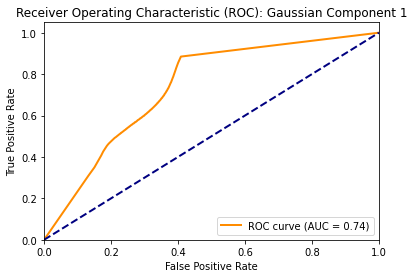

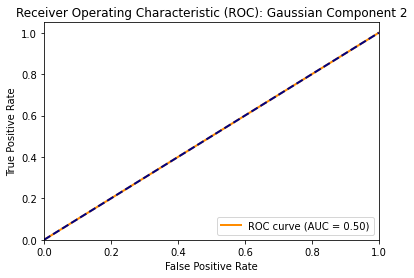

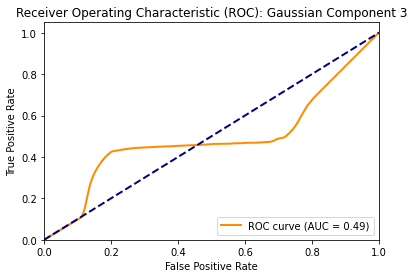

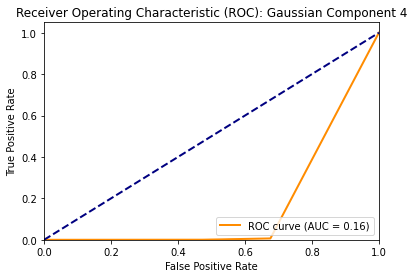

In [525]:
calculate_and_plot(true_mask, postprob_G4_TestImage1_onlyapple[0], custom_thresholds, 1)
calculate_and_plot(true_mask, postprob_G4_TestImage1_onlyapple[1], custom_thresholds, 2)
calculate_and_plot(true_mask, postprob_G4_TestImage1_onlyapple[2], custom_thresholds, 3)
calculate_and_plot(true_mask, postprob_G4_TestImage1_onlyapple[3], custom_thresholds, 4)

## Comments on plots: 

The AUC score of gaussian component 1 above when tested on image 1 is fairly average at 0.74. This is unsuprising when looking at the posterior plot. It fails to differentiate between the apple and the table. This will result in a high number of false positives. 

## Assessing downloaded images off internet: 

In [ ]:
#true masks of downloaded images off internet: 

true_mask1 = ColorImgs_downloaded_groundtruth[2]
true_mask1 = true_mask1.flatten()

true_mask2 = ColorImgs_downloaded_groundtruth[0]
true_mask2 = true_mask2.flatten()

true_mask3 = ColorImgs_downloaded_groundtruth[1]
true_mask3 = true_mask3.flatten()

# A reminder of what they look like: 

for index, myFile in enumerate(files_downloaded_test):
    im = plt.imread(myFile)
    ColorImgs_downloaded_test.append(im)
    plt.imshow(im)
    plt.title(f"Test Image (Downloaded) {index + 1}")
    plt.show()





In [531]:
# k = 2
postprob_G2_DownloadedImage1_onlyapple = getPosteriorProbabilities(downloaded_image_1, apple_mog_model_onlyapples_k2)
postprob_G2_DownloadedImage2_onlyapple = getPosteriorProbabilities(downloaded_image_2, apple_mog_model_onlyapples_k2)
postprob_G2_DownloadedImage3_onlyapple = getPosteriorProbabilities(downloaded_image_3, apple_mog_model_onlyapples_k2)


Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


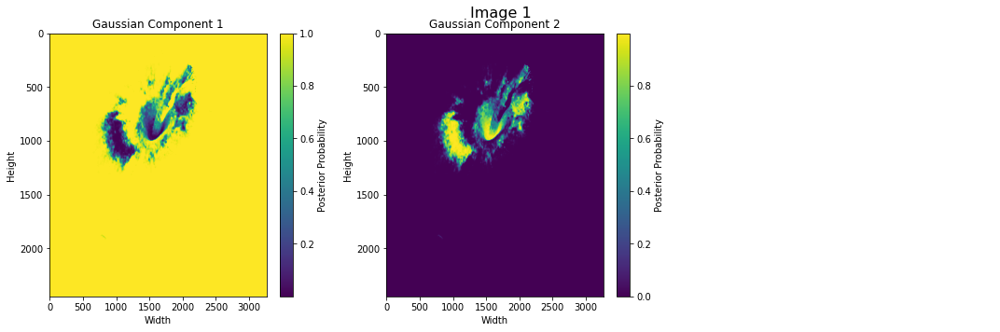

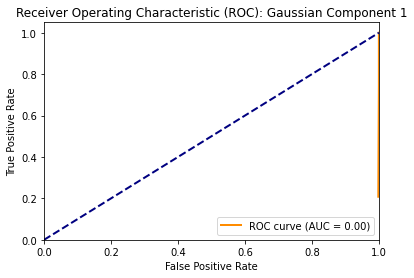

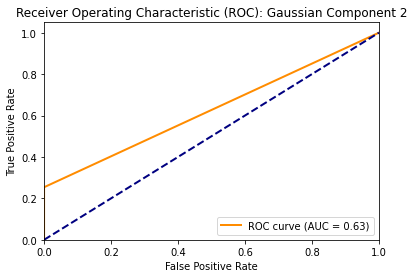

In [532]:
reshape_and_plotposteriors(files_downloaded_test[0],postprob_G2_DownloadedImage1_onlyapple, figure_title =  "Image 1")
calculate_and_plot(true_mask1, postprob_G2_DownloadedImage1_onlyapple[0], custom_thresholds, 1)
calculate_and_plot(true_mask1, postprob_G2_DownloadedImage1_onlyapple[1], custom_thresholds, 2)


## Comments on plots: 

Similar to the test image 1 already given, an MoG model with 2 gaussians struggles to classify the apple in the first downloaded image. 



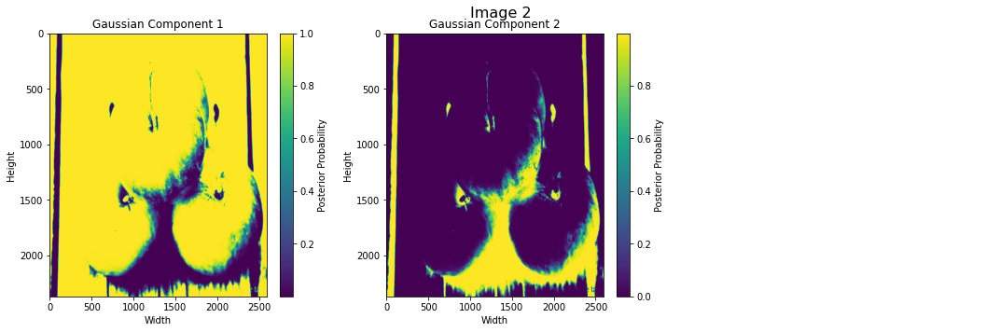

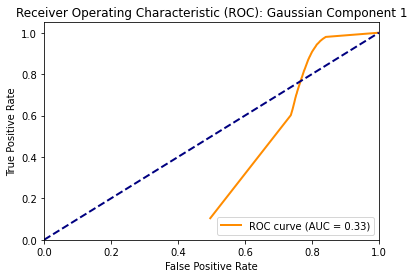

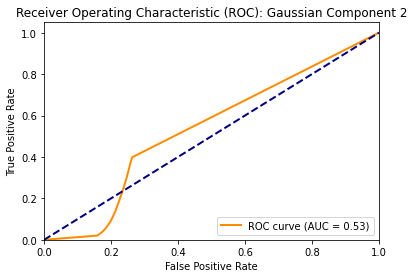

In [533]:
reshape_and_plotposteriors(files_downloaded_test[1],postprob_G2_DownloadedImage2_onlyapple, figure_title =  "Image 2")
calculate_and_plot(true_mask2, postprob_G2_DownloadedImage2_onlyapple[0], custom_thresholds, 1)
calculate_and_plot(true_mask2, postprob_G2_DownloadedImage2_onlyapple[1], custom_thresholds, 2)



## Comments on plots: 

Similar to the test image 1 already given, an MoG model with 2 gaussians struggles to classify the apple in the second downloaded image. 


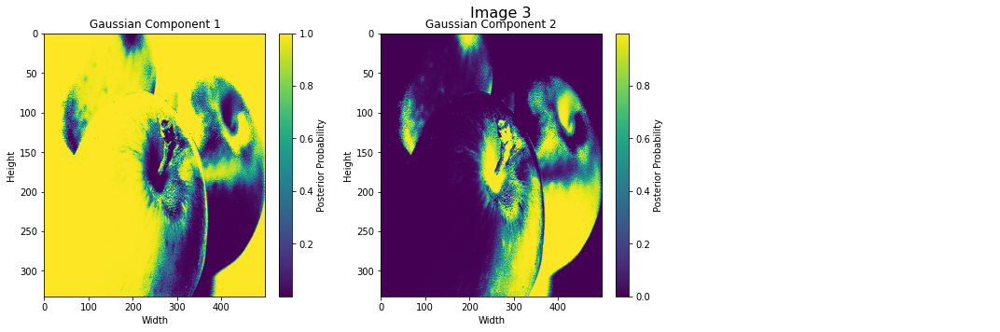

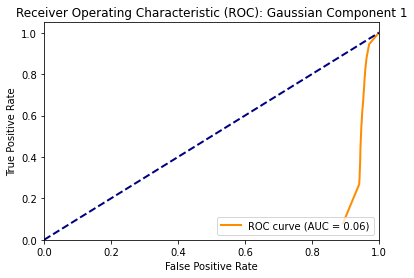

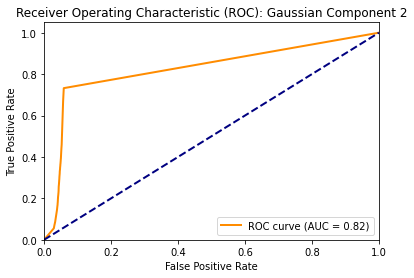

In [534]:
reshape_and_plotposteriors(files_downloaded_test[2],postprob_G2_DownloadedImage3_onlyapple, figure_title =  "Image 3")
calculate_and_plot(true_mask3, postprob_G2_DownloadedImage3_onlyapple[0], custom_thresholds, 1)
calculate_and_plot(true_mask3, postprob_G2_DownloadedImage3_onlyapple[1], custom_thresholds, 2)



## Comments on plots: 

The model now performs slightly better. But I suspect this is due to there being a larger amount of shadow in this image, and the gaussian component 2 models the shadow well, not the apple.


In [535]:
# k = 3

postprob_G3_DownloadedImage1_onlyapple = getPosteriorProbabilities(downloaded_image_1, apple_mog_model_onlyapples_k3)
postprob_G3_DownloadedImage2_onlyapple = getPosteriorProbabilities(downloaded_image_2, apple_mog_model_onlyapples_k3)
postprob_G3_DownloadedImage3_onlyapple = getPosteriorProbabilities(downloaded_image_3, apple_mog_model_onlyapples_k3)






Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


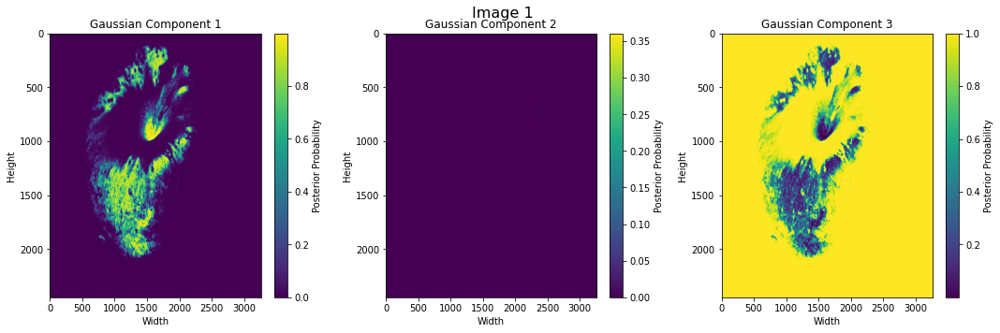

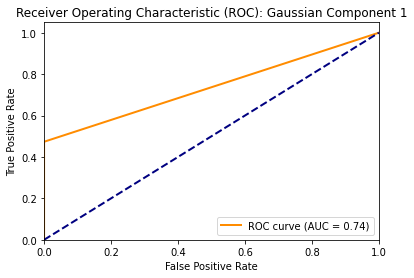

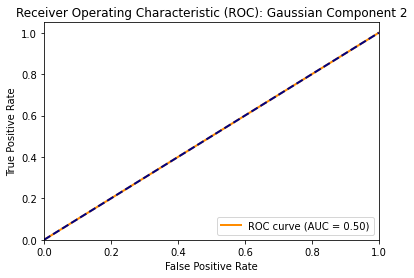

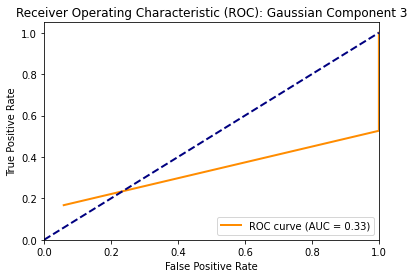

In [536]:
reshape_and_plotposteriors(files_downloaded_test[0],postprob_G3_DownloadedImage1_onlyapple, figure_title =  "Image 1")
calculate_and_plot(true_mask1, postprob_G3_DownloadedImage1_onlyapple[0], custom_thresholds, 1)
calculate_and_plot(true_mask1, postprob_G3_DownloadedImage1_onlyapple[1], custom_thresholds, 2)
calculate_and_plot(true_mask1, postprob_G3_DownloadedImage1_onlyapple[2], custom_thresholds, 3)


# Comments on plots: 

This is again poor for the MoG model with 3 gaussians. It is unclear what the three gaussian components are modelling.

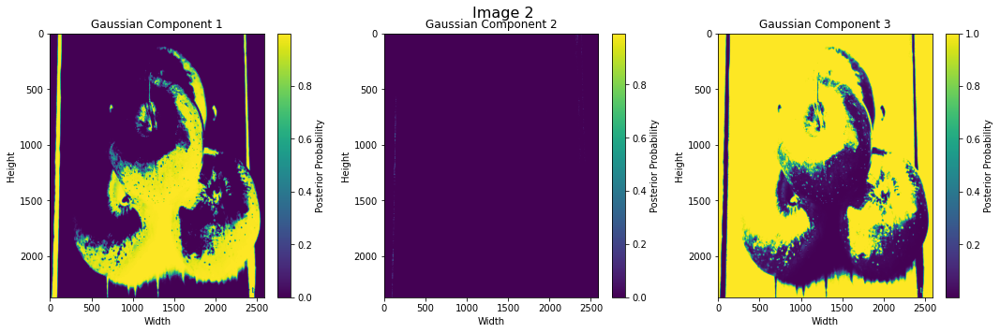

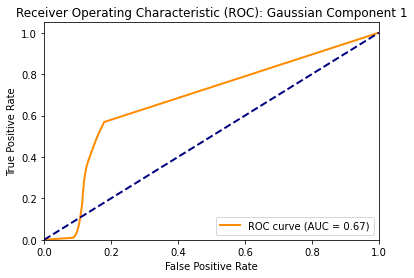

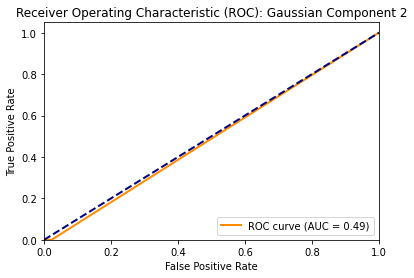

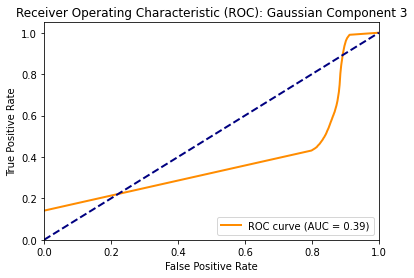

In [537]:
reshape_and_plotposteriors(files_downloaded_test[1],postprob_G3_DownloadedImage2_onlyapple, figure_title =  "Image 2")
calculate_and_plot(true_mask2, postprob_G3_DownloadedImage2_onlyapple[0], custom_thresholds, 1)
calculate_and_plot(true_mask2, postprob_G3_DownloadedImage2_onlyapple[1], custom_thresholds, 2)
calculate_and_plot(true_mask2, postprob_G3_DownloadedImage2_onlyapple[2], custom_thresholds, 3)






# Comments on plots: 

This is again poor for the MoG model with 3 gaussians. It is slightly better for gaussian component 1 but it is unclear what the three gaussian components are modelling.

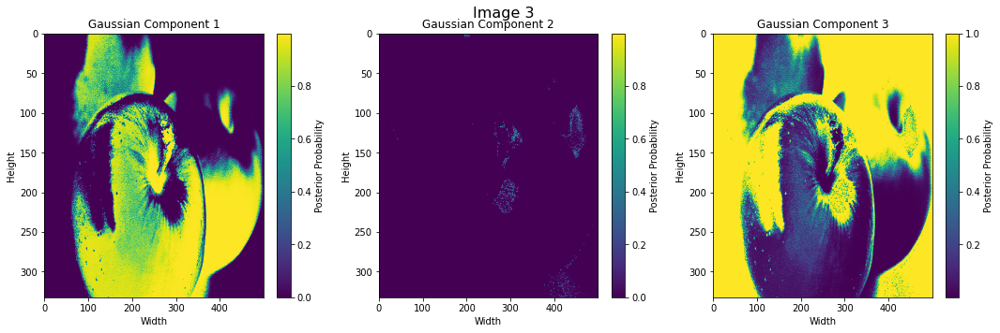

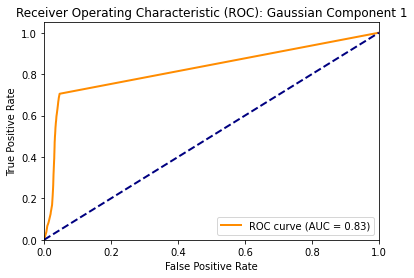

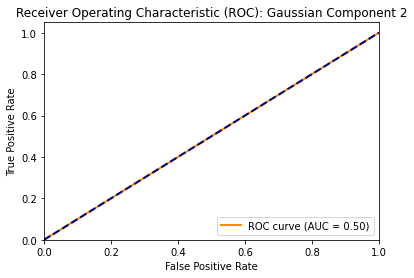

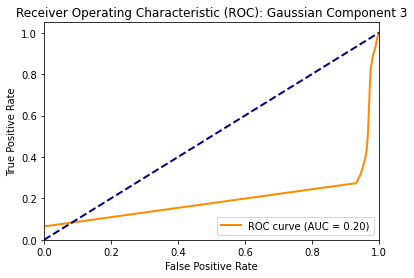

In [539]:

reshape_and_plotposteriors(files_downloaded_test[2],postprob_G3_DownloadedImage3_onlyapple, figure_title =  "Image 3")
calculate_and_plot(true_mask3, postprob_G3_DownloadedImage3_onlyapple[0], custom_thresholds, 1)
calculate_and_plot(true_mask3, postprob_G3_DownloadedImage3_onlyapple[1], custom_thresholds, 2)
calculate_and_plot(true_mask3, postprob_G3_DownloadedImage3_onlyapple[2], custom_thresholds, 3)




# Comments on plots: 

Gaussian component 1 does well, returning a decent AUC score of 0.83.



In [540]:
# k = 4

postprob_G4_DownloadedImage1_onlyapple = getPosteriorProbabilities(downloaded_image_1, apple_mog_model_onlyapples_k4)
postprob_G4_DownloadedImage2_onlyapple = getPosteriorProbabilities(downloaded_image_2, apple_mog_model_onlyapples_k4)
postprob_G4_DownloadedImage3_onlyapple = getPosteriorProbabilities(downloaded_image_3, apple_mog_model_onlyapples_k4)





Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


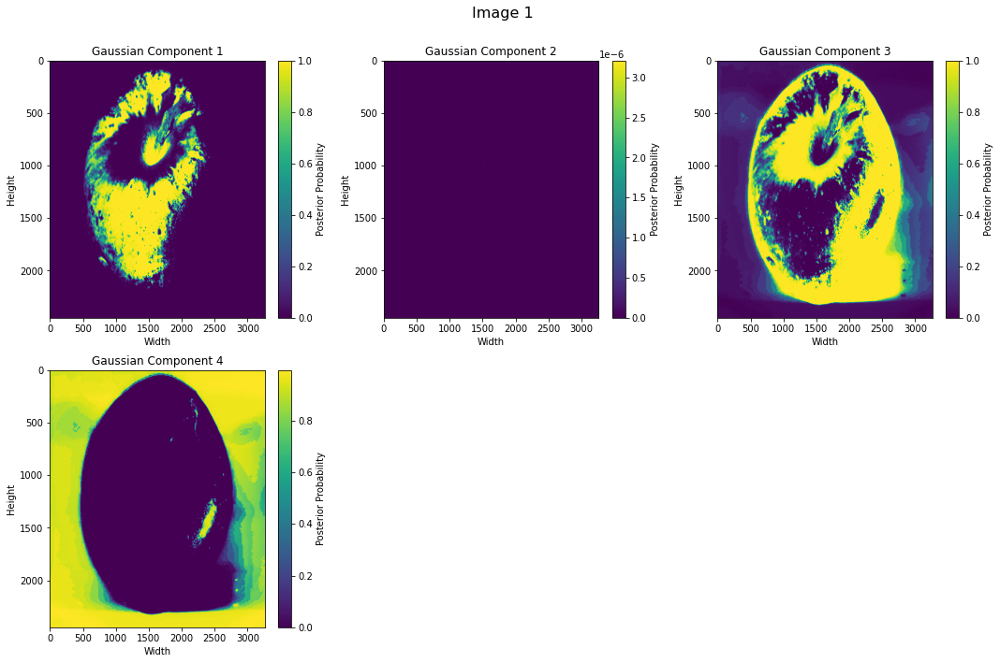

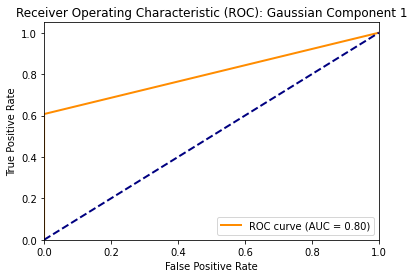

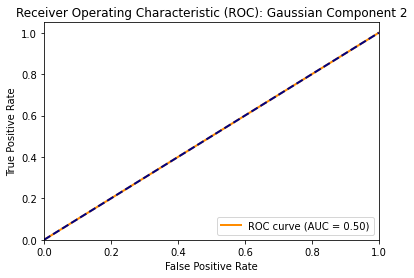

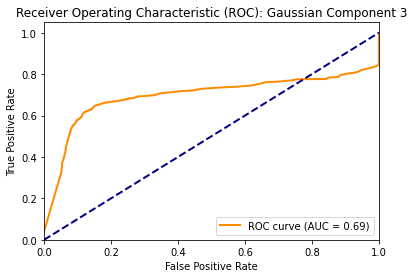

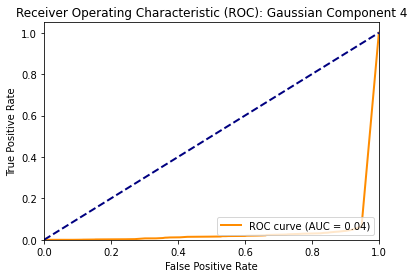

In [541]:

reshape_and_plotposteriors(files_downloaded_test[0],postprob_G4_DownloadedImage1_onlyapple, figure_title =  "Image 1")
calculate_and_plot(true_mask1, postprob_G4_DownloadedImage1_onlyapple[0], custom_thresholds, 1)
calculate_and_plot(true_mask1, postprob_G4_DownloadedImage1_onlyapple[1], custom_thresholds, 2)
calculate_and_plot(true_mask1, postprob_G4_DownloadedImage1_onlyapple[2], custom_thresholds, 3)
calculate_and_plot(true_mask1, postprob_G4_DownloadedImage1_onlyapple[3], custom_thresholds, 4)





# Comments on plots: 

This MoG model with 4 gaussian components does adequately when classifying the apples according to the ROC-AUC curve when considering gaussian component 1 with an AUC of 0.80. It appears that components 1 and 3 seem to model the two components of the apple - the well-lit part and the not well- lit part. THis is an indication that the naive assumption that the RGB values of a red apple only being normally distributed according to one gaussian is incorrect. THis is why multiple gaussian component offer more flexibility.

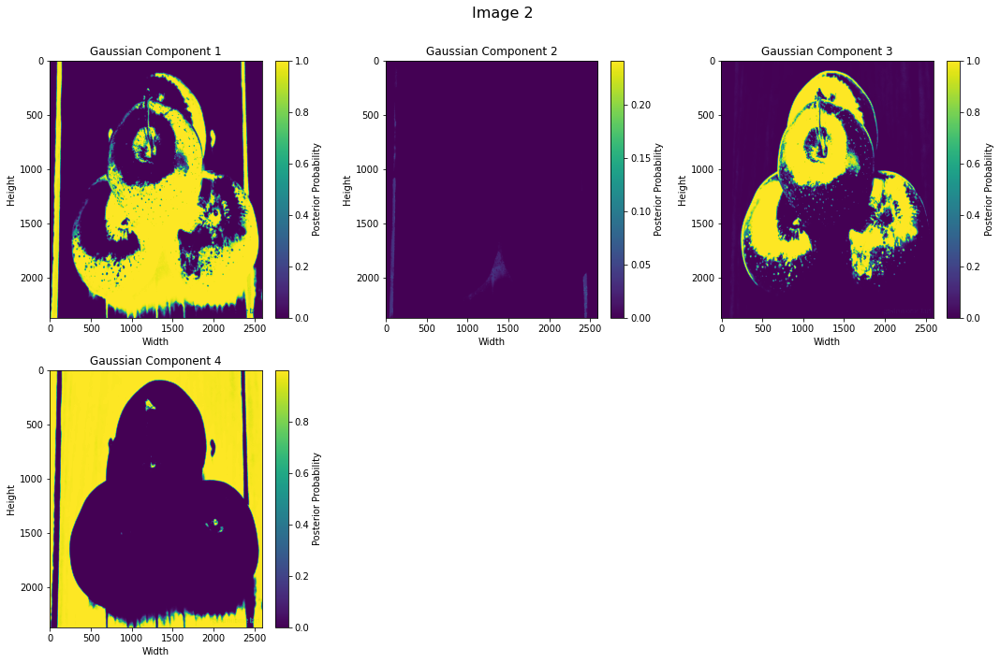

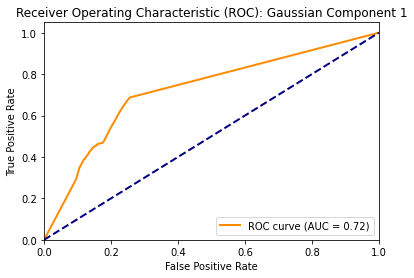

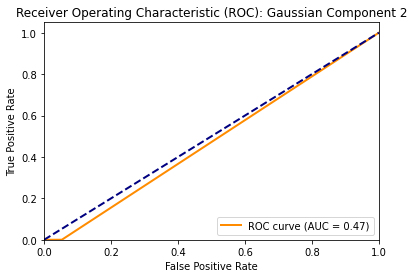

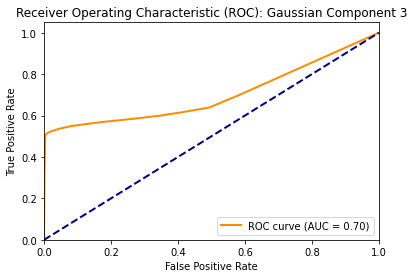

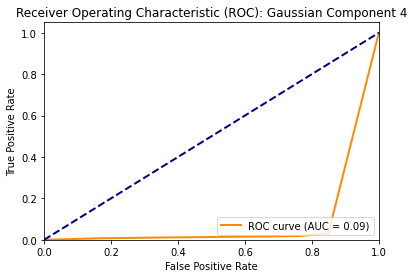

In [546]:
reshape_and_plotposteriors(files_downloaded_test[1],postprob_G4_DownloadedImage2_onlyapple, figure_title =  "Image 2")
calculate_and_plot(true_mask2, postprob_G4_DownloadedImage2_onlyapple[0], custom_thresholds, 1)
calculate_and_plot(true_mask2, postprob_G4_DownloadedImage2_onlyapple[1], custom_thresholds, 2)
calculate_and_plot(true_mask2, postprob_G4_DownloadedImage2_onlyapple[2], custom_thresholds, 3)
calculate_and_plot(true_mask2, postprob_G4_DownloadedImage2_onlyapple[3], custom_thresholds, 4)




# Comment on plots: 

THis is the same as the above. Components 1 and 3 model the areas of apples that are well-lit and not well-lit. WHile the AUC scores of these two components individually are not good, a model which incorporates the combination of the two components could perform very well.  It is good that these are the two same components as the downloaded test image above as it offers further evidence of what each gaussian component models in this 4 gaussian component MoG model. However, it is still unclear what component 2 models. 

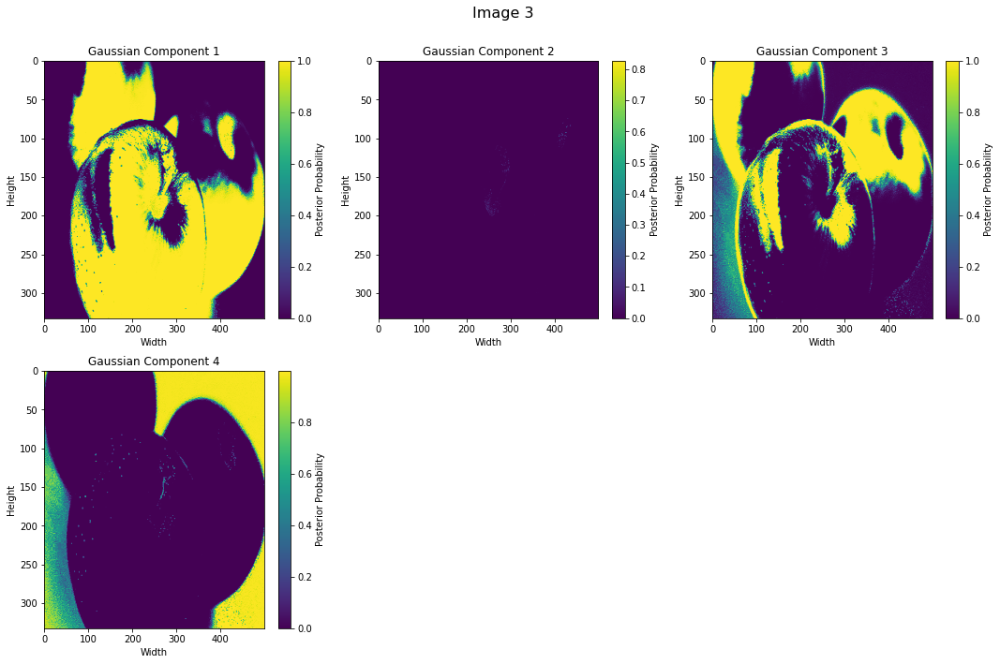

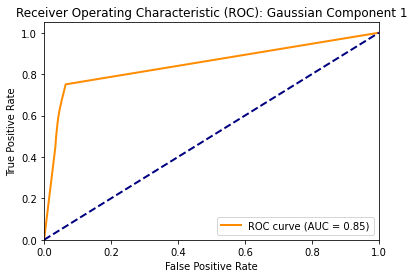

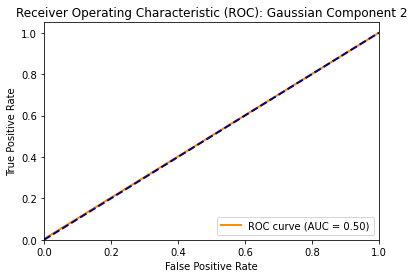

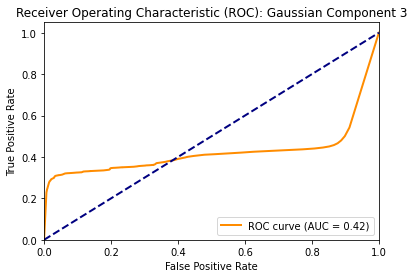

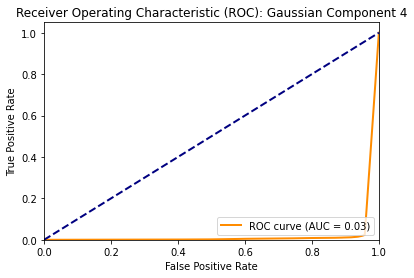

In [547]:
reshape_and_plotposteriors(files_downloaded_test[2],postprob_G4_DownloadedImage3_onlyapple, figure_title =  "Image 3")
calculate_and_plot(true_mask3, postprob_G4_DownloadedImage3_onlyapple[0], custom_thresholds, 1)
calculate_and_plot(true_mask3, postprob_G4_DownloadedImage3_onlyapple[1], custom_thresholds, 2)
calculate_and_plot(true_mask3, postprob_G4_DownloadedImage3_onlyapple[2], custom_thresholds, 3)
calculate_and_plot(true_mask3, postprob_G4_DownloadedImage3_onlyapple[3], custom_thresholds, 4)



## Comments on plots:

Again, this is the same as the test images above, what component 1 and component 3 model is clear and component 2 is superfluous it seems. This is an indication that perhaps as more gaussian components are considered in your model it can become increasingly unclear what some components are modelling in the training data.

## *Working with the model ran on combined apple and non-apple data*

I have decided to test the MoG model in general on the combined data as the EM algorithm is suited for unsupervised learning as well. While you have given truth masks for the training data so that we can separate the data into apple / non-apple pixels, I suspect this model will work just as well on combined data which does not make this separation. Hence why I have included this section aswell. 

I have started with a simple MoG model with 2 gaussian components for both the test image with the truth mask given and the three test images downloaded off the internet with custom truth masks. I will then move on to considering MoG models with more than 2 gaussian components. 

In [468]:
postprob_G2_TestImage1 = getPosteriorProbabilities(image_1_test, apple_mog_model)
postprob_G2_TestImage2 = getPosteriorProbabilities(image_2_test, apple_mog_model)
postprob_G2_TestImage3 = getPosteriorProbabilities(image_3_test, apple_mog_model)

Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


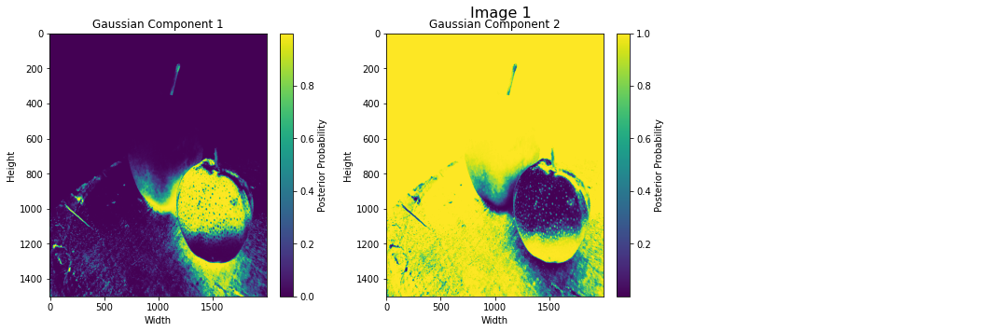

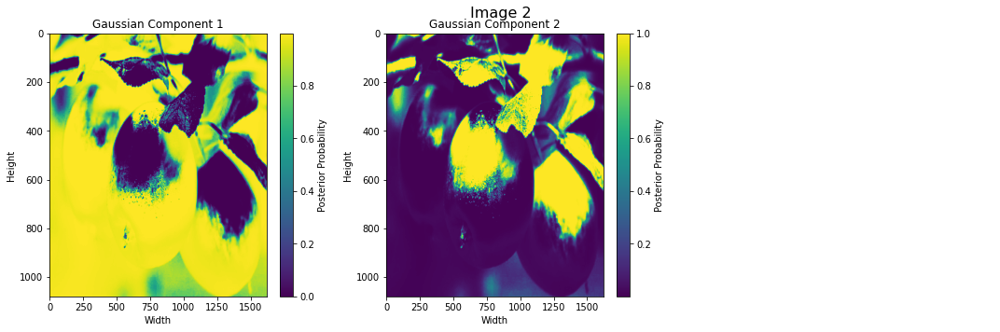

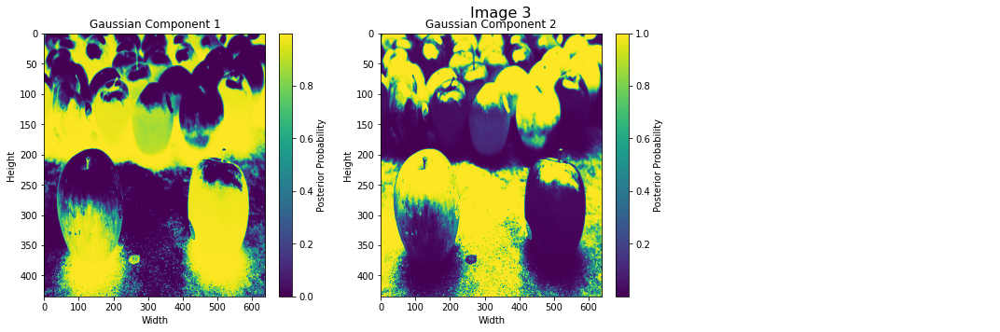

In [469]:
reshape_and_plotposteriors(files_test[0],postprob_G2_TestImage1, figure_title =  "Image 1")
reshape_and_plotposteriors(files_test[1],postprob_G2_TestImage2, figure_title =  "Image 2") 
reshape_and_plotposteriors(files_test[2],postprob_G2_TestImage3, figure_title = "Image 3") 


## Comment on plots: 

The plots above display the posterior probabilities of each pixel when fitting a MoG model with 2 gaussian components to the combined_data (i.e. when the apple pixels and the non-apple pixels are combined into one array). It seems to be an overly simplistic model (i.e. underfits) as it does not have the ability to differentiate between the orange and the apple in image 1. It seems that this model is only able to differentiate between everything not orange and the orange in image 1. It is unable to catch the nuance between the apple and the orange. As for image 2,  it is unable to differentiate between the green parts of the apple and the background in image 2. In image 3, gaussian component 1 denotes a high posterior probability for the shadowed areas, and gaussian component 3 denotes a high posterior probability for the non-shadow areas. However, this is not the intended effect as we want to model the apples, which it is not good at. 

In [ ]:
calculate_and_plot(true_mask, postprob_G2_TestImage1[0], custom_thresholds, 1)
calculate_and_plot(true_mask, postprob_G2_TestImage1[1], custom_thresholds, 2)


# Downloaded images off internet: 

In [498]:
postprob_G2_DownloadedImage1 = getPosteriorProbabilities(downloaded_image_1, apple_mog_model)
postprob_G2_DownloadedImage2 = getPosteriorProbabilities(downloaded_image_2, apple_mog_model)
postprob_G2_DownloadedImage3 = getPosteriorProbabilities(downloaded_image_3, apple_mog_model)

Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


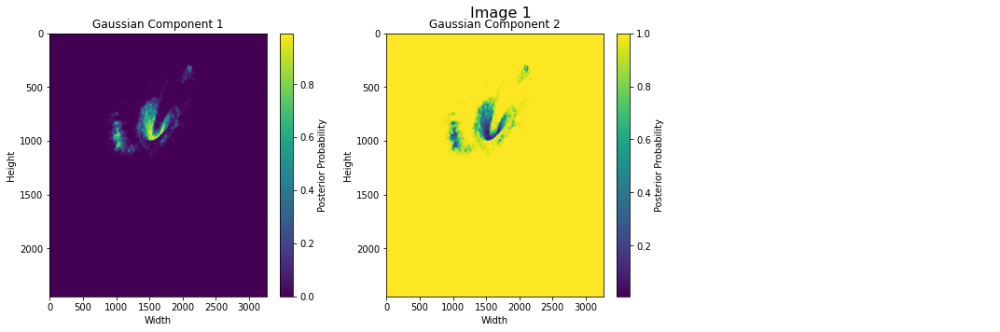

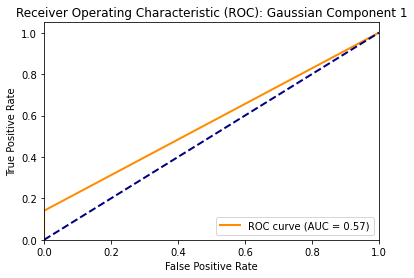

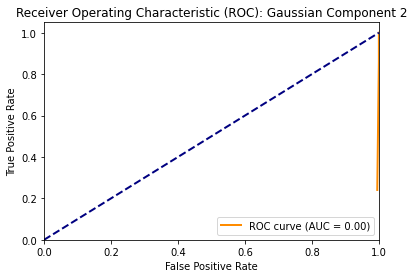

In [499]:
#true masks of downloaded images off internet: 

true_mask1 = ColorImgs_downloaded_groundtruth[2]
true_mask1 = true_mask1.flatten()

true_mask2 = ColorImgs_downloaded_groundtruth[0]
true_mask2 = true_mask2.flatten()

true_mask3 = ColorImgs_downloaded_groundtruth[1]
true_mask3 = true_mask3.flatten()


reshape_and_plotposteriors(files_downloaded_test[0],postprob_G2_DownloadedImage1, figure_title =  "Image 1")
calculate_and_plot(true_mask1, postprob_G2_DownloadedImage1[0], custom_thresholds, 1)
calculate_and_plot(true_mask1, postprob_G2_DownloadedImage1[1], custom_thresholds, 2)


## Comments on plots: 

This is a very poor model. It has only been able to differentiate between the shadowed area of the image and the non-shadow area. Another indicator that this model is not sufficient in terms of gaussian components.

The poor AUC score of each reflects this. 
  
    

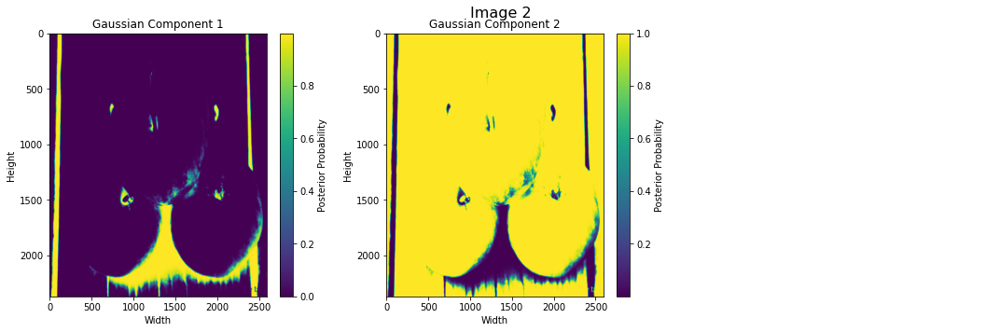

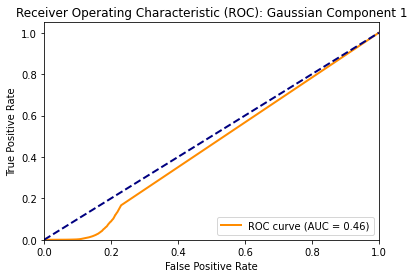

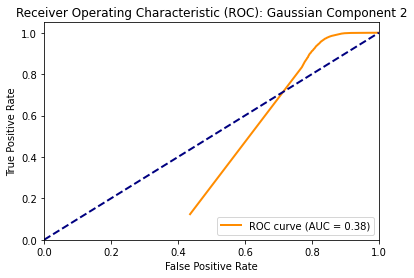

In [502]:
reshape_and_plotposteriors(files_downloaded_test[1],postprob_G2_DownloadedImage2, figure_title =  "Image 2")
calculate_and_plot(true_mask2, postprob_G2_DownloadedImage2[0], custom_thresholds, 1)
calculate_and_plot(true_mask2, postprob_G2_DownloadedImage2[1], custom_thresholds, 2)


## Comment on plots:
    
THis is the same as the images above; this model clearly only has the capability of modelling shadow / non-shadow areas of the image when we want to model the difference between an apple and not an apple. The poor AUC scores reflect this (both worse than chance in fact).

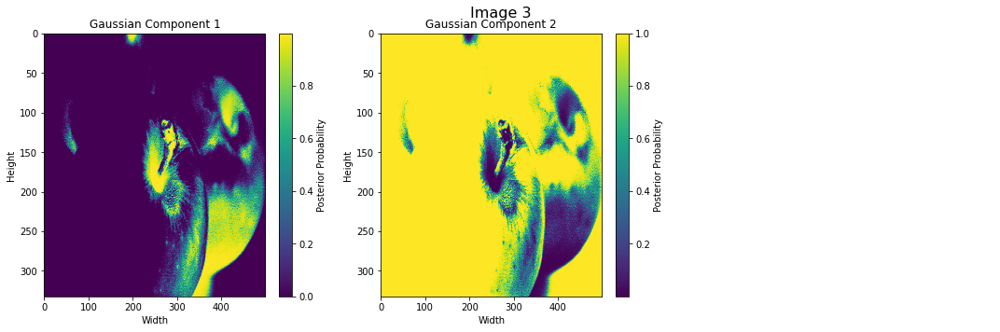

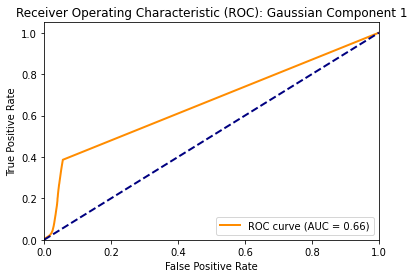

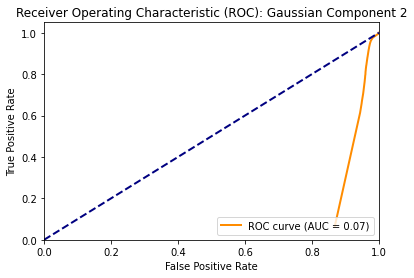

In [503]:
reshape_and_plotposteriors(files_downloaded_test[2],postprob_G2_DownloadedImage3, figure_title =  "Image 3")
calculate_and_plot(true_mask3, postprob_G2_DownloadedImage3[0], custom_thresholds, 1)
calculate_and_plot(true_mask3, postprob_G2_DownloadedImage3[1], custom_thresholds, 2)


## Comment on plots: 

The model is slightly better at modelling the presence of an apple as displayed in the image of the posterior probability of gaussian component 1 and its slightly better than chance AUC score of 0.66. However this is still a poor model - opting to model the presence of a shadow as opposed to an apple. The only reason this model performs better than the other images is because there is more shadow in the image. Thus, it is better due to a good choice of test data, not the quality of the model.

### Now moving on to MoG models with more than 3 gaussian components trained on the combined data

In [365]:
apple_mog_model_k3 = fitMixGauss(combined_data, 3)

Log Likelihood Iter 0 : -54287604.554

Log Likelihood After Iter 0 : -12842902.373

Estimated time remaining: 3474.61 seconds
Log Likelihood After Iter 1 : -12807362.419

Estimated time remaining: 3321.69 seconds
Log Likelihood After Iter 2 : -12735221.200

Estimated time remaining: 3191.56 seconds
Log Likelihood After Iter 3 : -12648032.765

Estimated time remaining: 3070.99 seconds
Log Likelihood After Iter 4 : -12591613.822

Estimated time remaining: 2948.78 seconds
Log Likelihood After Iter 5 : -12563145.115

Estimated time remaining: 2828.74 seconds
Log Likelihood After Iter 6 : -12539980.762

Estimated time remaining: 2707.71 seconds
Log Likelihood After Iter 7 : -12510340.155

Estimated time remaining: 2594.71 seconds
Log Likelihood After Iter 8 : -12468403.875

Estimated time remaining: 2478.27 seconds
Log Likelihood After Iter 9 : -12412869.248

Estimated time remaining: 2360.57 seconds
Log Likelihood After Iter 10 : -12359110.811

Estimated time remaining: 2242.75 seconds
Log

In [385]:
postprob_G3_TestImage1 = getPosteriorProbabilities(image_1_test, apple_mog_model_k3)
postprob_G3_TestImage2 = getPosteriorProbabilities(image_2_test, apple_mog_model_k3)
postprob_G3_TestImage3 = getPosteriorProbabilities(image_3_test, apple_mog_model_k3)



Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


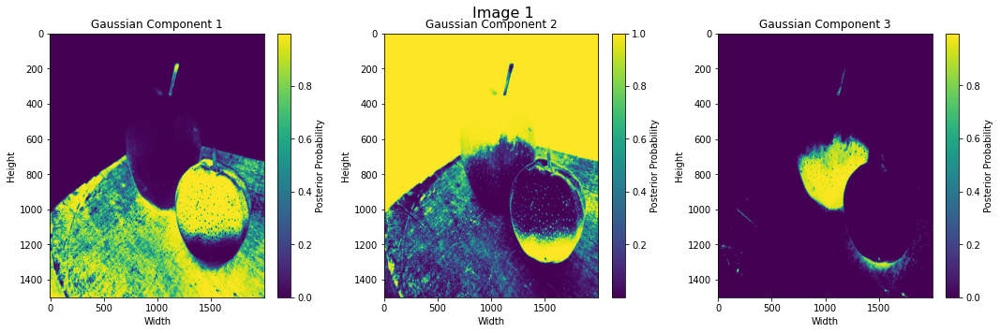

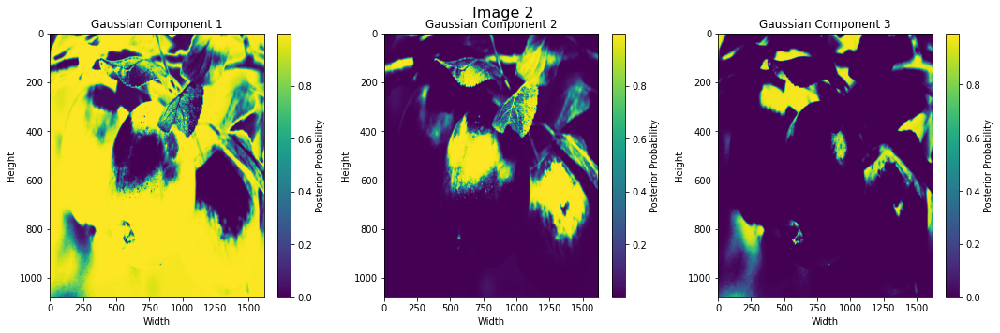

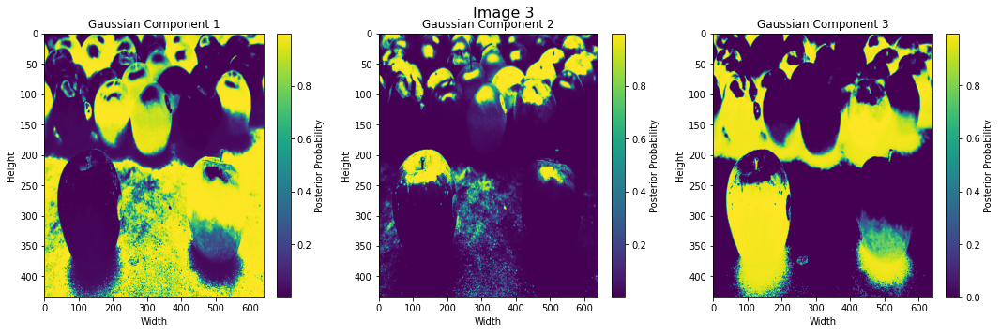

In [526]:

reshape_and_plotposteriors(files_test[0],postprob_G3_TestImage1, figure_title =  "Image 1")
reshape_and_plotposteriors(files_test[1],postprob_G3_TestImage2, figure_title =  "Image 2") 
reshape_and_plotposteriors(files_test[2],postprob_G3_TestImage3,figure_title = "Image 3") 





## Comment on plots: 

These plots display the posterior probabilities of the test images given using the MoG model with 3 gaussian components on the combined data. This seems to work well at classifying the apple in image 1 but struggles with image 2 and 3 - perhaps needing more gaussian components.  

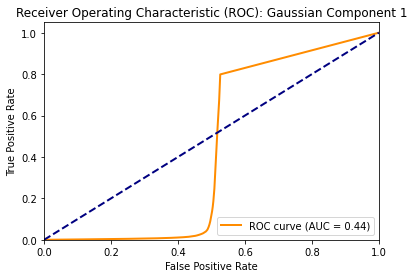

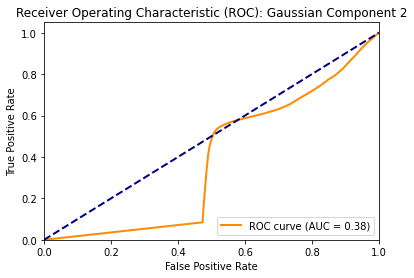

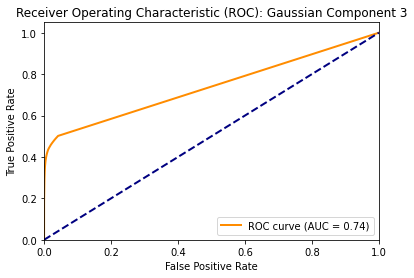

In [416]:
calculate_and_plot(true_mask, postprob_G3_TestImage1[0], custom_thresholds, 1)
calculate_and_plot(true_mask, postprob_G3_TestImage1[1], custom_thresholds, 2)
calculate_and_plot(true_mask, postprob_G3_TestImage1[2], custom_thresholds, 3)


## Comment on plots: 

The AUC score for image 1 is the best when plotting the posteriors of gaussian component 3 - marginally performing better than the model with 2 gaussian components. Still not good though. 

In [395]:
apple_mog_model_k4 = fitMixGauss(combined_data, 4)

postprob_G4_TestImage1 = getPosteriorProbabilities(image_1_test, apple_mog_model_k4)
postprob_G4_TestImage2 = getPosteriorProbabilities(image_2_test, apple_mog_model_k4)
postprob_G4_TestImage3 = getPosteriorProbabilities(image_3_test, apple_mog_model_k4)

Log Likelihood Iter 0 : -54760781.652

Log Likelihood After Iter 0 : -12843667.205

Estimated time remaining: 4535.81 seconds
Log Likelihood After Iter 1 : -12806614.005

Estimated time remaining: 4332.68 seconds
Log Likelihood After Iter 2 : -12731450.909

Estimated time remaining: 4204.95 seconds
Log Likelihood After Iter 3 : -12639452.397

Estimated time remaining: 4059.90 seconds
Log Likelihood After Iter 4 : -12574375.004

Estimated time remaining: 18812.71 seconds
Log Likelihood After Iter 5 : -12533309.007

Estimated time remaining: 15666.22 seconds
Log Likelihood After Iter 6 : -12496380.781

Estimated time remaining: 13369.78 seconds
Log Likelihood After Iter 7 : -12451467.057

Estimated time remaining: 11608.91 seconds
Log Likelihood After Iter 8 : -12392300.283

Estimated time remaining: 10207.59 seconds
Log Likelihood After Iter 9 : -12338081.888

Estimated time remaining: 9055.24 seconds
Log Likelihood After Iter 10 : -12307230.927

Estimated time remaining: 11451.18 secon

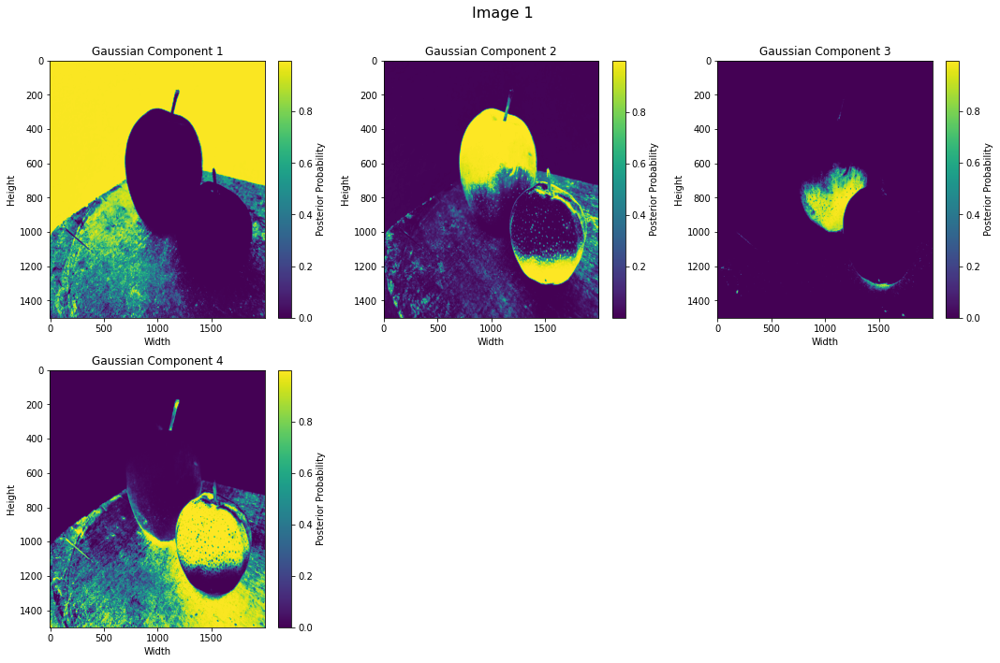

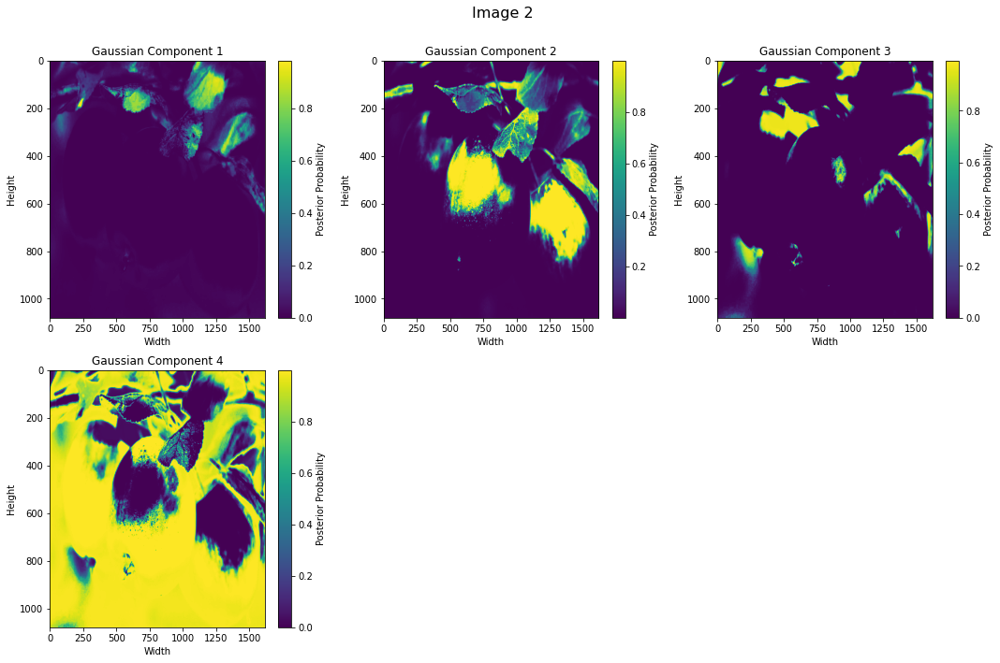

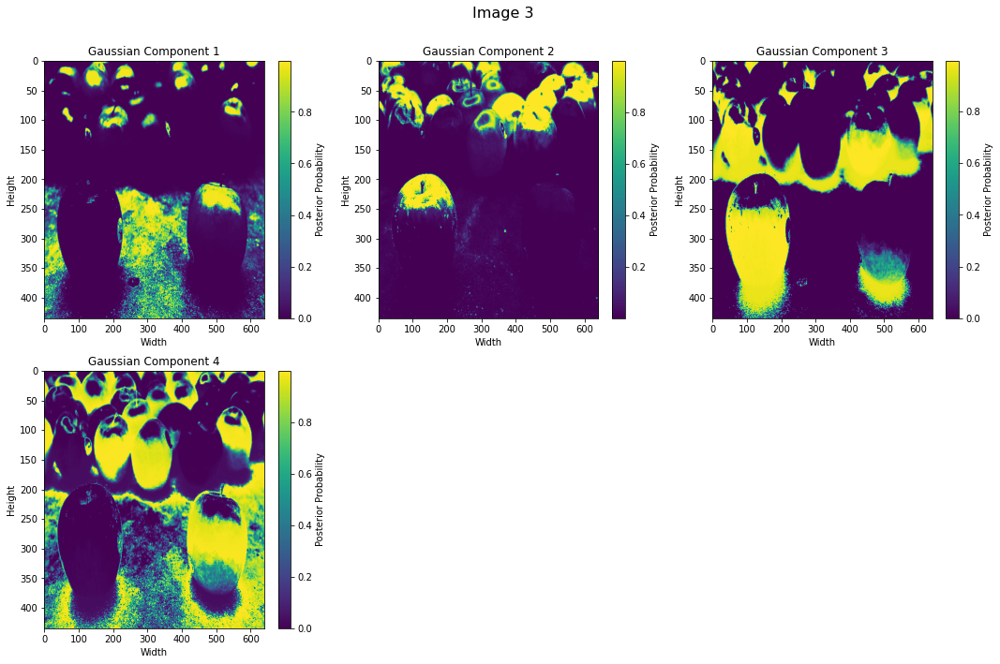

In [418]:
reshape_and_plotposteriors(files_test[0],postprob_G4_TestImage1, figure_title = "Image 1")
reshape_and_plotposteriors(files_test[1],postprob_G4_TestImage2, figure_title = "Image 2") 
reshape_and_plotposteriors(files_test[2],postprob_G4_TestImage3, figure_title = "Image 3") 
    

## Comment on plots: 

Now moving onto the model that fits the training data to 4 gaussian components using the combined data. From plotting the posterior probabilites above, it seems to do better at modelling the different aspects of these images (shadows, background area, different coloured apples). For image 1, Gaussian component 2 and 4 seem to successfully differentiate the apple and the orange, and gaussian component 1 seems to successfully differentiate the background of the image. 

However, images 2 and 3 are less successful at differentiating apples. I suspect this is due to these images being more complicated in the RGB space than image 1 - perhaps pointing towards the need for more gaussian components in the model.   

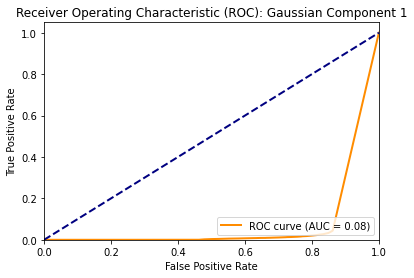

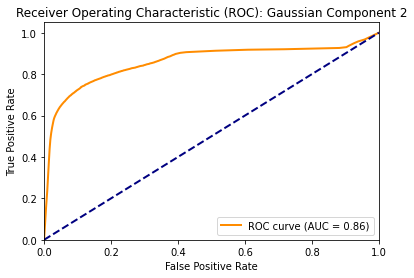

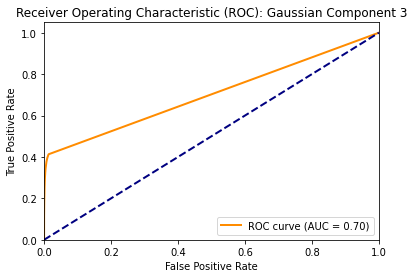

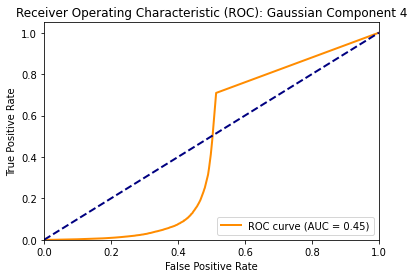

In [419]:
calculate_and_plot(true_mask, postprob_G4_TestImage1[0], custom_thresholds, 1)
calculate_and_plot(true_mask, postprob_G4_TestImage1[1], custom_thresholds, 2)
calculate_and_plot(true_mask, postprob_G4_TestImage1[2], custom_thresholds, 3)
calculate_and_plot(true_mask, postprob_G4_TestImage1[3], custom_thresholds, 4)

## Comments on plot: 

Now, the AUC scores are improving when considering 4 gaussian components. An AUC score of 0.86 is good when considering gaussian component 2. However, I suspect this would not be as good for images 2 and 3 if we could test them if truth masks were supplied. 


In [396]:
apple_mog_model_k5 = fitMixGauss(combined_data, 5)

postprob_G5_TestImage1 = getPosteriorProbabilities(image_1_test, apple_mog_model_k5)
postprob_G5_TestImage2 = getPosteriorProbabilities(image_2_test, apple_mog_model_k5)
postprob_G5_TestImage3 = getPosteriorProbabilities(image_3_test, apple_mog_model_k5)

Log Likelihood Iter 0 : -55203183.102

Log Likelihood After Iter 0 : -12834407.232

Estimated time remaining: 5542.26 seconds
Log Likelihood After Iter 1 : -12784843.960

Estimated time remaining: 5312.79 seconds
Log Likelihood After Iter 2 : -12696972.542

Estimated time remaining: 23053.73 seconds
Log Likelihood After Iter 3 : -12608957.923

Estimated time remaining: 17874.82 seconds
Log Likelihood After Iter 4 : -12554718.977

Estimated time remaining: 14693.17 seconds
Log Likelihood After Iter 5 : -12518745.746

Estimated time remaining: 12508.51 seconds
Log Likelihood After Iter 6 : -12485435.499

Estimated time remaining: 10896.72 seconds
Log Likelihood After Iter 7 : -12449408.365

Estimated time remaining: 15165.04 seconds
Log Likelihood After Iter 8 : -12408333.002

Estimated time remaining: 15508.03 seconds
Log Likelihood After Iter 9 : -12362326.043

Estimated time remaining: 13669.47 seconds
Log Likelihood After Iter 10 : -12313921.775

Estimated time remaining: 12132.65 se

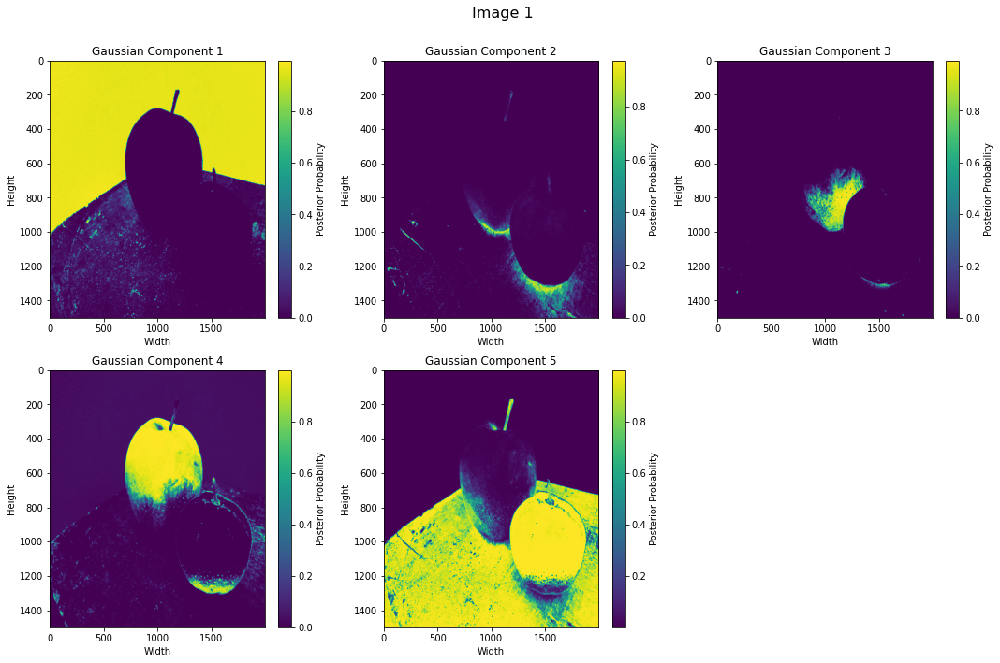

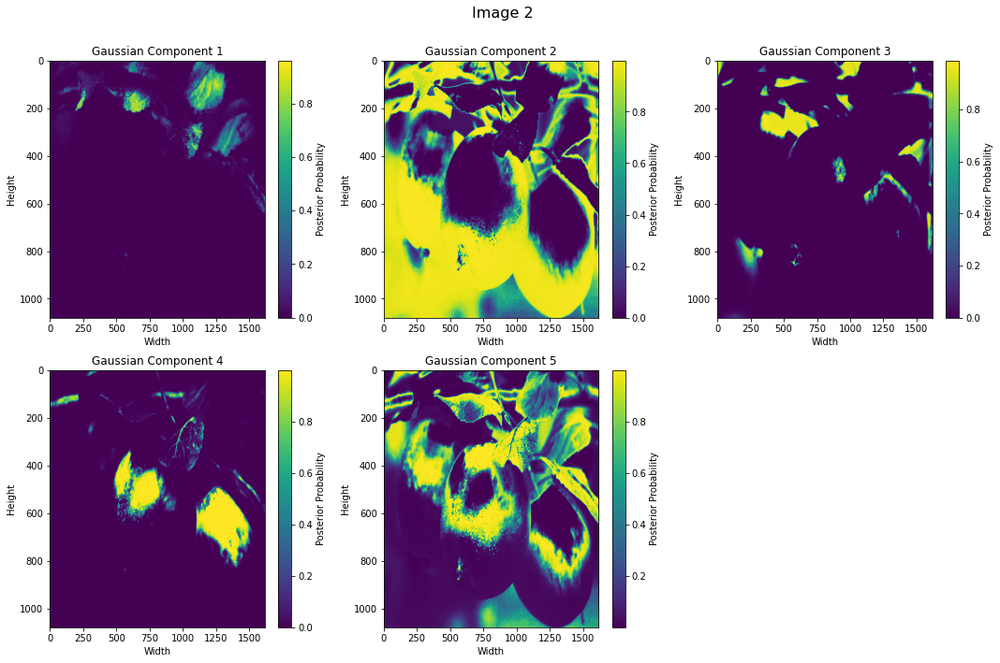

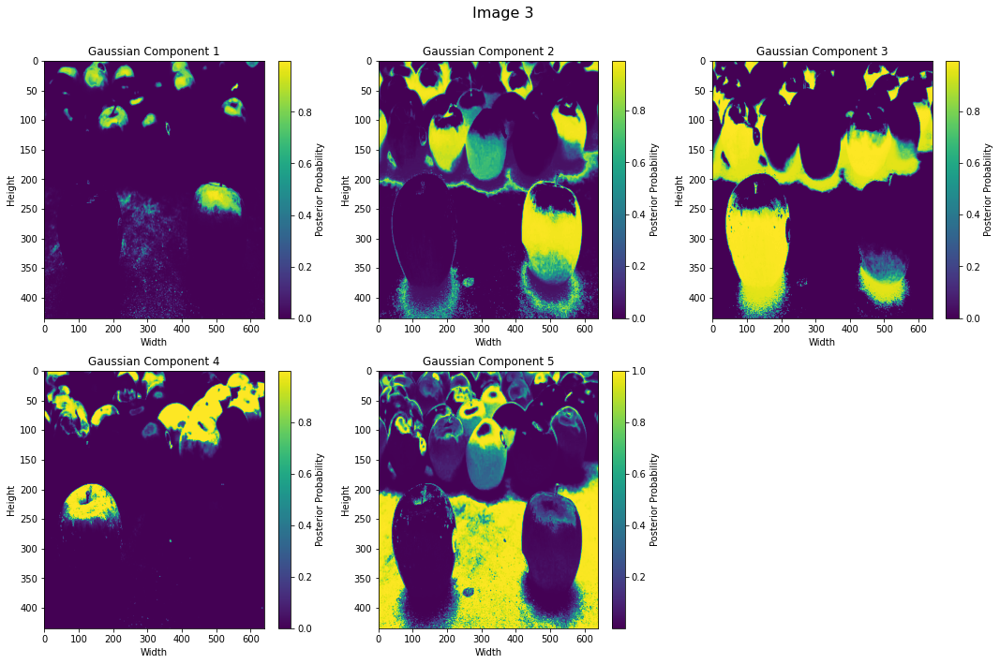

In [420]:
reshape_and_plotposteriors(files_test[0],postprob_G5_TestImage1,figure_title =  "Image 1")
reshape_and_plotposteriors(files_test[1],postprob_G5_TestImage2,figure_title = "Image 2") 
reshape_and_plotposteriors(files_test[2],postprob_G5_TestImage3,figure_title = "Image 3") 
    

## Comments on plots: 

As more gaussian components are considered, for simpler images such as image 1 where there are 4 distinct colours, you can get a clear image of an apple in terms of posterior probabilities. However, for more complicated images such as image 2 and 3, it becomes increasingly more difficult to determine what each component models from the training data. This is a major drawback of a high gaussian component MoG model: the interpretability of the model becomes increasingly more opaque. 



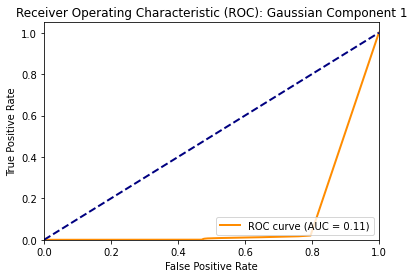

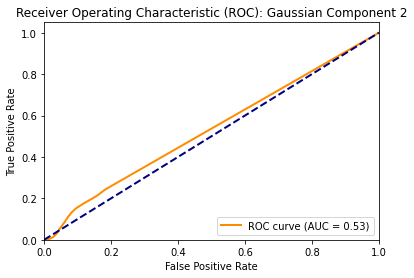

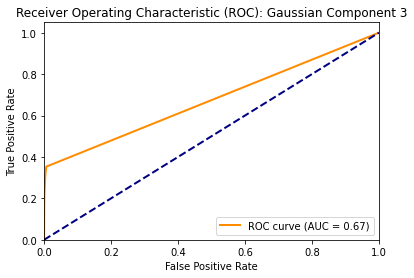

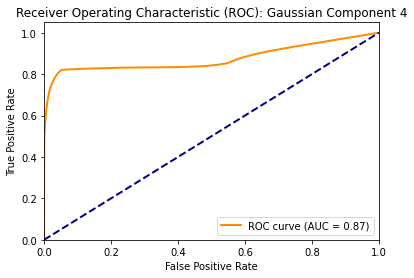

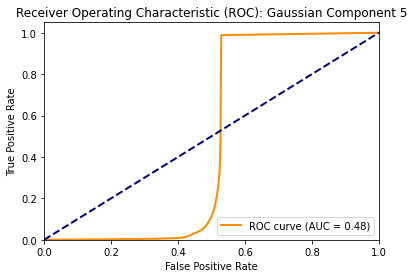

In [421]:
calculate_and_plot(true_mask, postprob_G5_TestImage1[0], custom_thresholds, 1)
calculate_and_plot(true_mask, postprob_G5_TestImage1[1], custom_thresholds, 2)
calculate_and_plot(true_mask, postprob_G5_TestImage1[2], custom_thresholds, 3)
calculate_and_plot(true_mask, postprob_G5_TestImage1[3], custom_thresholds, 4)
calculate_and_plot(true_mask, postprob_G5_TestImage1[4], custom_thresholds, 5)

## Comments on the plots: 

The AUC score from component 4 is good (0.87). However, as discussed the opacity of the model is a problem and this is not a good indicator as to whether this is the correct model.



# Downloaded images, k = 3-6: 

In [427]:
# k = 3

postprob_G3_DownloadedImage1 = getPosteriorProbabilities(downloaded_image_1, apple_mog_model_k3)
postprob_G3_DownloadedImage2 = getPosteriorProbabilities(downloaded_image_2, apple_mog_model_k3)
postprob_G3_DownloadedImage3 = getPosteriorProbabilities(downloaded_image_3, apple_mog_model_k3)

Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


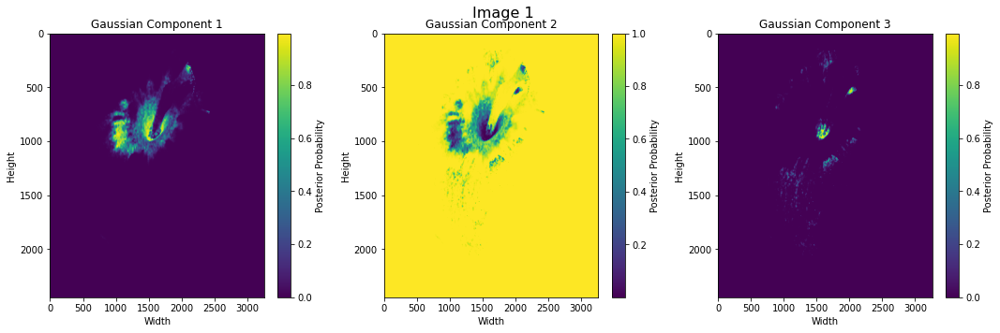

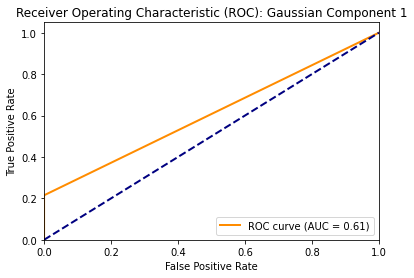

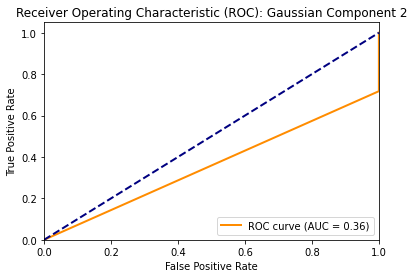

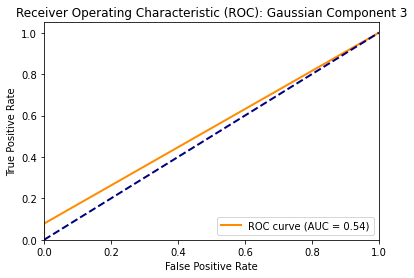

In [428]:
#true masks of downloaded images off internet: 

true_mask1 = ColorImgs_downloaded_groundtruth[2]
true_mask1 = true_mask1.flatten()

true_mask2 = ColorImgs_downloaded_groundtruth[0]
true_mask2 = true_mask2.flatten()

true_mask3 = ColorImgs_downloaded_groundtruth[1]
true_mask3 = true_mask3.flatten()


reshape_and_plotposteriors(files_downloaded_test[0],postprob_G3_DownloadedImage1, figure_title =  "Image 1")
calculate_and_plot(true_mask1, postprob_G3_DownloadedImage1[0], custom_thresholds, 1)
calculate_and_plot(true_mask1, postprob_G3_DownloadedImage1[1], custom_thresholds, 2)
calculate_and_plot(true_mask1, postprob_G3_DownloadedImage1[2], custom_thresholds, 3)


### Comments on the plots: 

When testing the three gaussian MoG model on the combined data, it does not work well on the first downloaded off the internet. The ROC-AUC curves reflect this. 



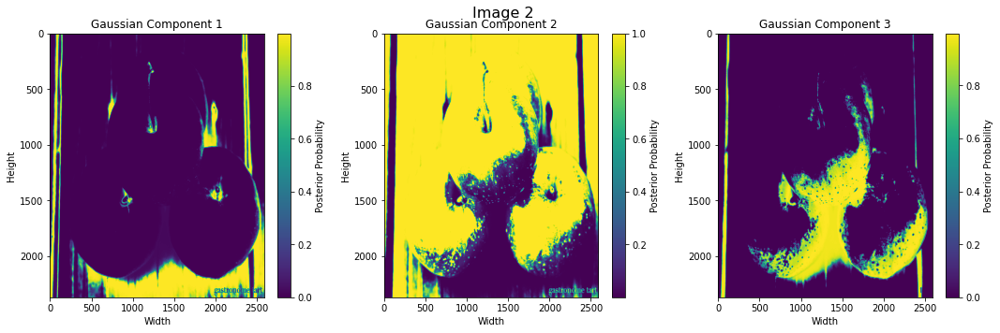

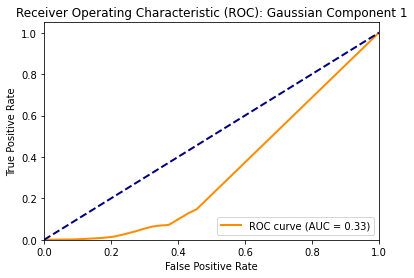

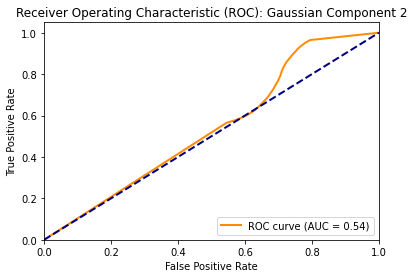

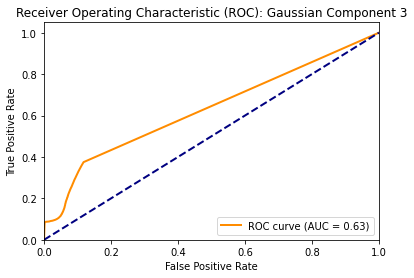

In [429]:
reshape_and_plotposteriors(files_downloaded_test[1],postprob_G3_DownloadedImage2, figure_title =  "Image 2")
calculate_and_plot(true_mask2, postprob_G3_DownloadedImage2[0], custom_thresholds, 1)
calculate_and_plot(true_mask2, postprob_G3_DownloadedImage2[1], custom_thresholds, 2)
calculate_and_plot(true_mask2, postprob_G3_DownloadedImage2[2], custom_thresholds, 3)

### Comments on the plots: 

When testing the three gaussian MoG model on the combined data, it does not work well on the second downloaded off the internet. The ROC-AUC curves reflect this. 


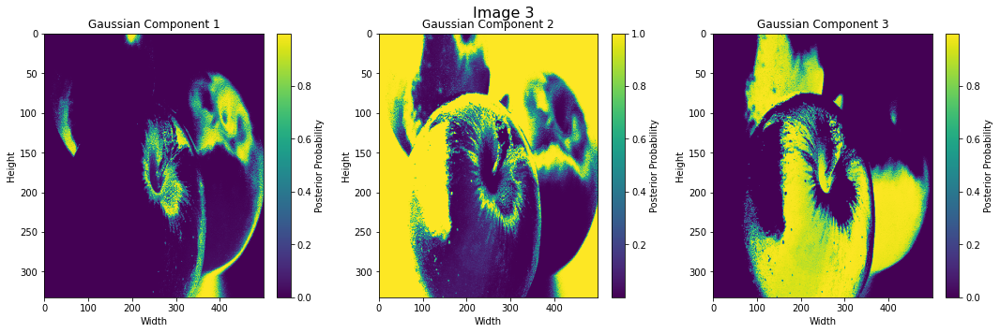

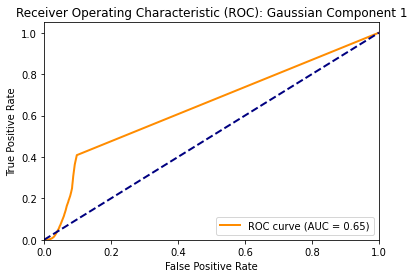

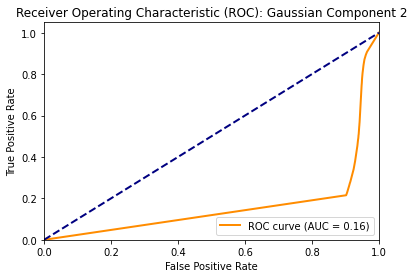

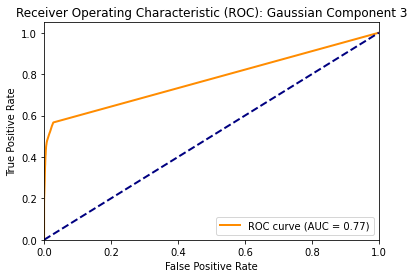

In [430]:
reshape_and_plotposteriors(files_downloaded_test[2],postprob_G3_DownloadedImage3, figure_title = "Image 3")
calculate_and_plot(true_mask3, postprob_G3_DownloadedImage3[0], custom_thresholds, 1)
calculate_and_plot(true_mask3, postprob_G3_DownloadedImage3[1], custom_thresholds, 2)
calculate_and_plot(true_mask3, postprob_G3_DownloadedImage3[2], custom_thresholds, 3)

### Comments on the plots: 

When testing the three gaussian MoG model on the combined data, it works slightly better on the third test image but still not good - as reflected by an AUC score of 0.77.


In [431]:
# k = 4

postprob_G4_DownloadedImage1 = getPosteriorProbabilities(downloaded_image_1, apple_mog_model_k4)
postprob_G4_DownloadedImage2 = getPosteriorProbabilities(downloaded_image_2, apple_mog_model_k4)
postprob_G4_DownloadedImage3 = getPosteriorProbabilities(downloaded_image_3, apple_mog_model_k4)

Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


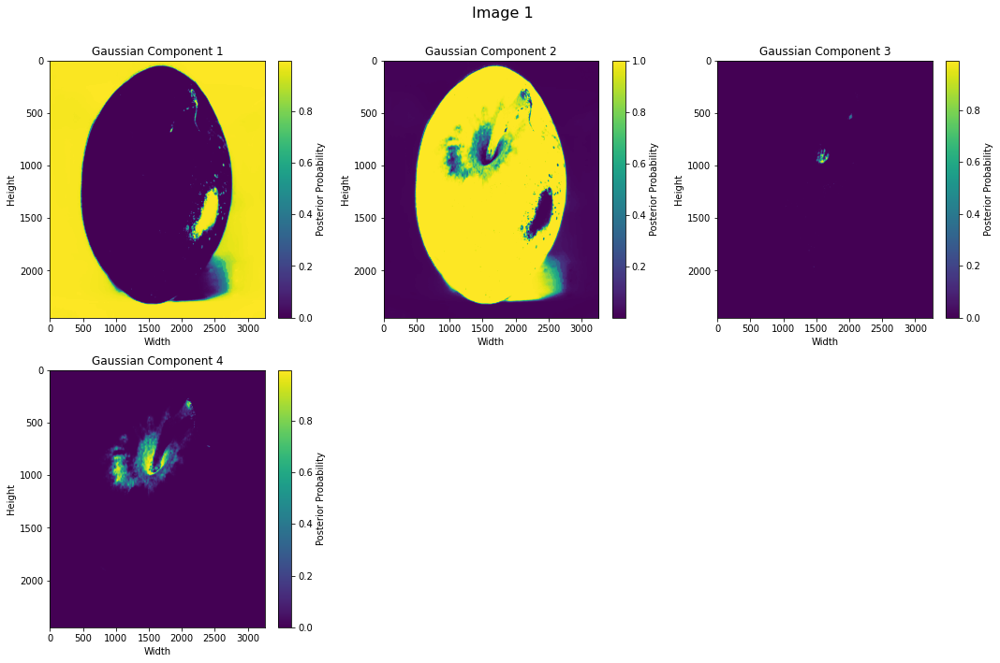

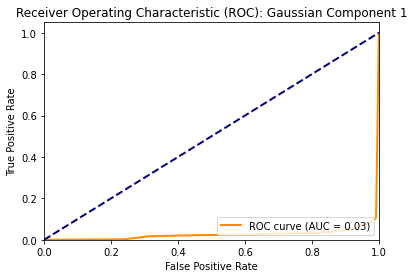

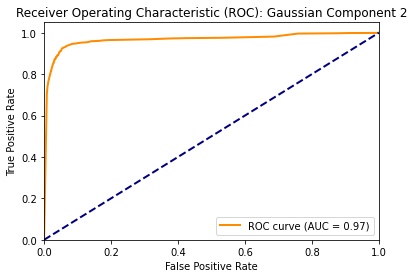

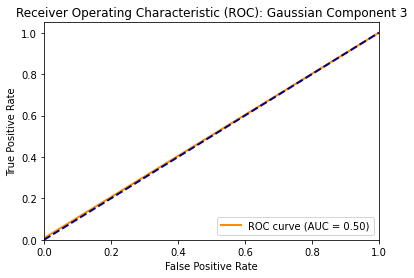

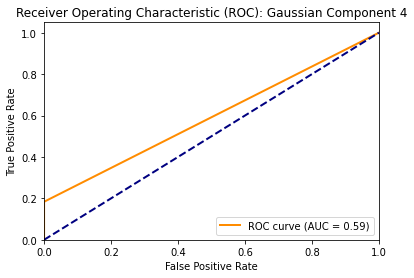

In [432]:
reshape_and_plotposteriors(files_downloaded_test[0],postprob_G4_DownloadedImage1, figure_title =  "Image 1")
calculate_and_plot(true_mask1, postprob_G4_DownloadedImage1[0], custom_thresholds, 1)
calculate_and_plot(true_mask1, postprob_G4_DownloadedImage1[1], custom_thresholds, 2)
calculate_and_plot(true_mask1, postprob_G4_DownloadedImage1[2], custom_thresholds, 3)
calculate_and_plot(true_mask1, postprob_G4_DownloadedImage1[3], custom_thresholds, 4)

### Comments on the plots: 

Now testing the 4 gaussian MoG model on the first image downloaded off the internet, gaussian component 2 seems to work very well at classifying the apple, with an AUC score of 0.97. However, this image is a simple image with a red apple and a clear distinct background with a contrasting colour, so this is not necessarily an indicator that this model is optimal. Nonetheless it is an indicator that this model is good at classifying a red apple with a distinct non-apple background. 



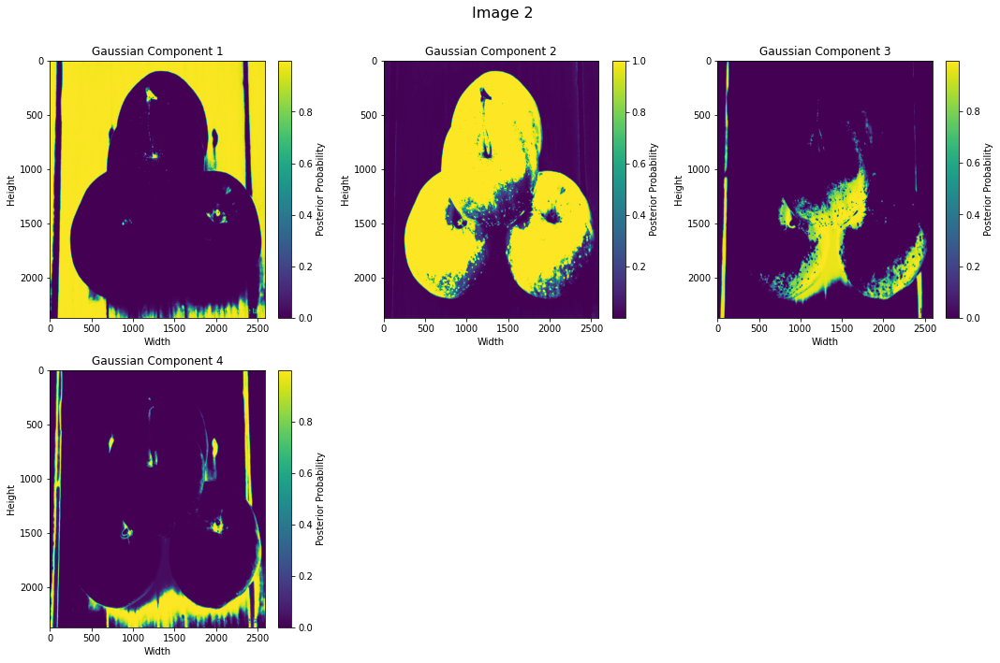

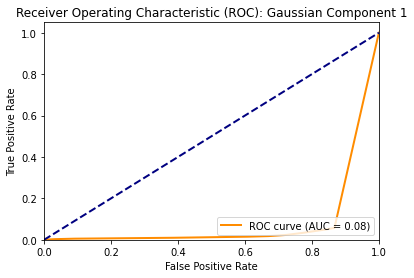

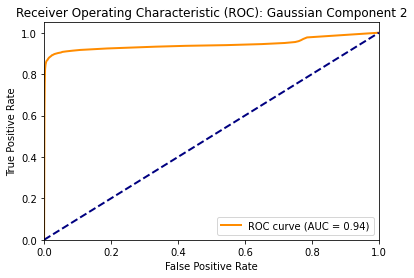

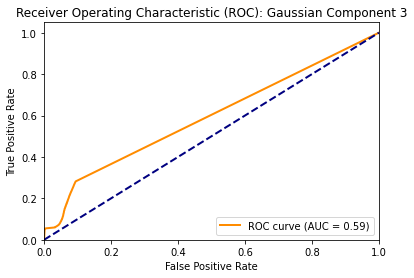

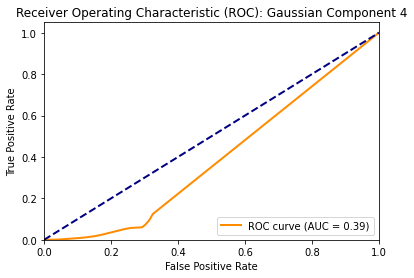

In [433]:
reshape_and_plotposteriors(files_downloaded_test[1],postprob_G4_DownloadedImage2, figure_title =  "Image 2")
calculate_and_plot(true_mask2, postprob_G4_DownloadedImage2[0], custom_thresholds, 1)
calculate_and_plot(true_mask2, postprob_G4_DownloadedImage2[1], custom_thresholds, 2)
calculate_and_plot(true_mask2, postprob_G4_DownloadedImage2[2], custom_thresholds, 3)
calculate_and_plot(true_mask2, postprob_G4_DownloadedImage2[3], custom_thresholds, 4)

# Comments on the plots: 

Again this model works well on the second test image downloaded off the internet. Gaussian component 2 performs well (slightly worse than previous with an AUC score of 0.94). I suspect this is due to the presence of more shadow  in this test image which gaussian component 3 seems to model. 



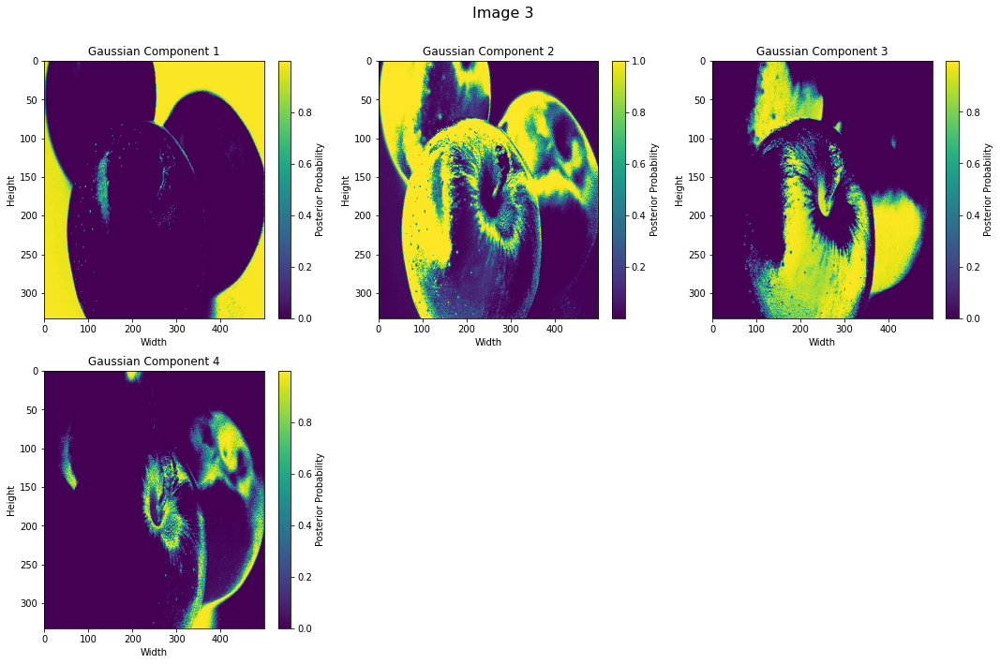

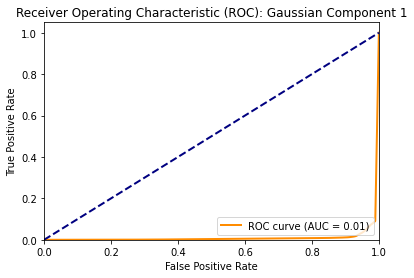

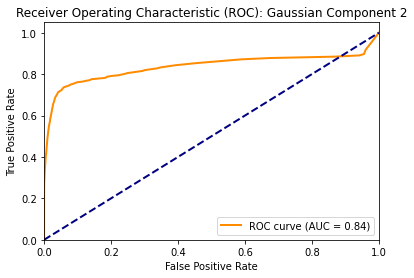

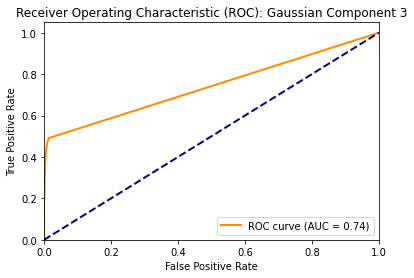

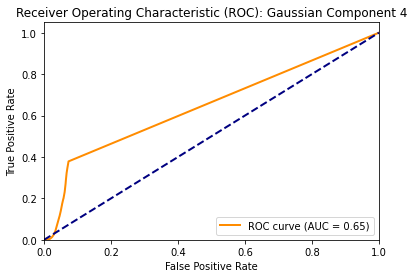

In [434]:
reshape_and_plotposteriors(files_downloaded_test[2],postprob_G4_DownloadedImage3, figure_title =  "Image 3")
calculate_and_plot(true_mask3, postprob_G4_DownloadedImage3[0], custom_thresholds, 1)
calculate_and_plot(true_mask3, postprob_G4_DownloadedImage3[1], custom_thresholds, 2)
calculate_and_plot(true_mask3, postprob_G4_DownloadedImage3[2], custom_thresholds, 3)
calculate_and_plot(true_mask3, postprob_G4_DownloadedImage3[3], custom_thresholds, 4)

## Comments on plots:

This model is a good in indicator of the shortcomings of this 4 gaussian MoG model; this test image of the internet has the highest amount of shadow. Gaussian components 2 and 3 are both adequate (with AUC scores of 0.84 and 0.74) but not good. Thus, when it comes to images of apples with more shadow, the model has difficulty identifying the apple in parts. This is also an indication of the shortcomings of the MoG model in general; the naive assumption that all of the apple pixels will exist in separate, distinct gaussians is perhaps incorrect. There is likely to be a level of nuance in real-life test images due to textures, colours similar to apples that are not apples (e.g. a background which may be red), shadows etc. 

In [435]:
# k = 5

postprob_G5_DownloadedImage1 = getPosteriorProbabilities(downloaded_image_1, apple_mog_model_k5)
postprob_G5_DownloadedImage2 = getPosteriorProbabilities(downloaded_image_2, apple_mog_model_k5)
postprob_G5_DownloadedImage3 = getPosteriorProbabilities(downloaded_image_3, apple_mog_model_k5)


Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


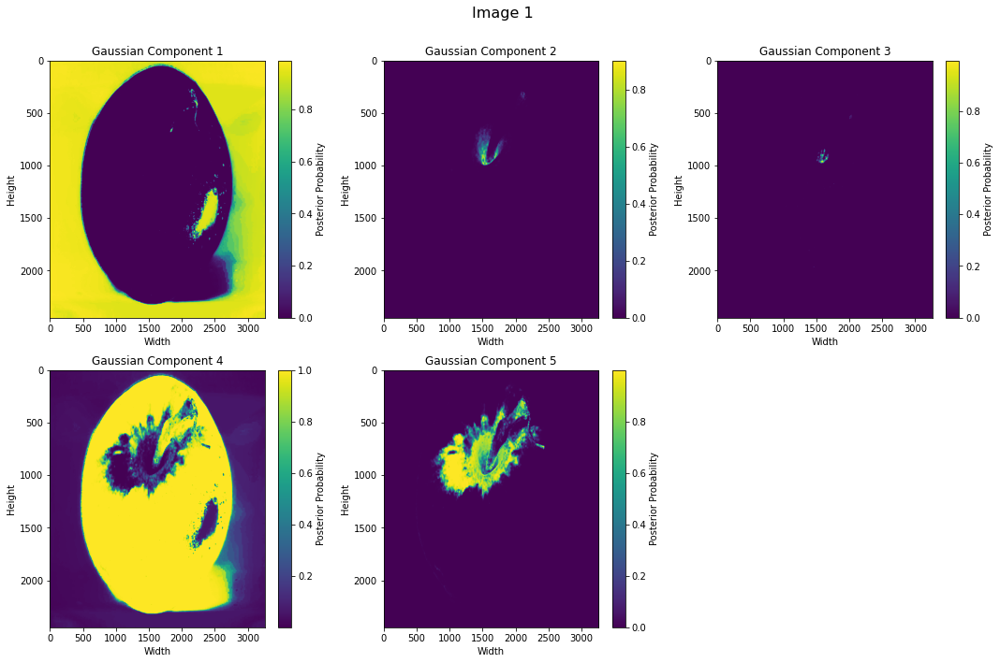

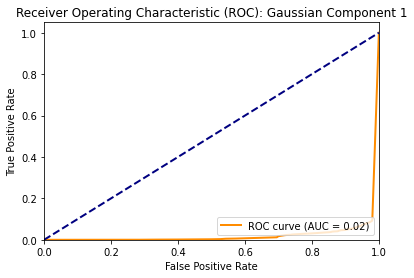

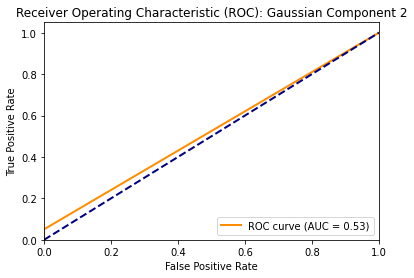

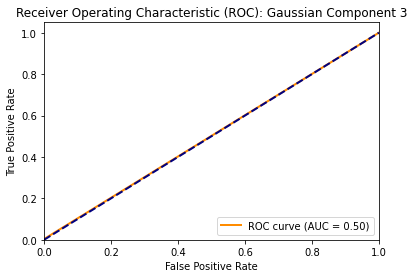

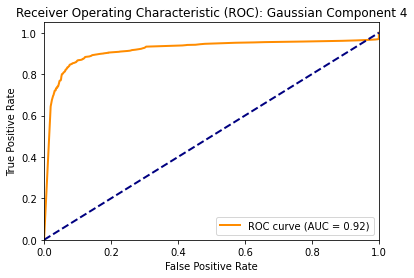

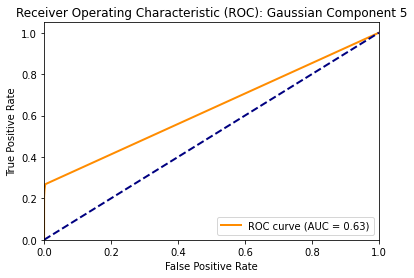

In [436]:
reshape_and_plotposteriors(files_downloaded_test[0],postprob_G5_DownloadedImage1, figure_title =  "Image 1")
calculate_and_plot(true_mask1, postprob_G5_DownloadedImage1[0], custom_thresholds, 1)
calculate_and_plot(true_mask1, postprob_G5_DownloadedImage1[1], custom_thresholds, 2)
calculate_and_plot(true_mask1, postprob_G5_DownloadedImage1[2], custom_thresholds, 3)
calculate_and_plot(true_mask1, postprob_G5_DownloadedImage1[3], custom_thresholds, 4)
calculate_and_plot(true_mask1, postprob_G5_DownloadedImage1[4], custom_thresholds, 5)

## Comments on the plots: 

For this five Gaussian MoG Model, gaussian component 4 classifies the apple well (reflected in the high AUC score of 0.92). However, the interpretability is also a major problem, what gaussian component 2 and 3 model is practically unidentifiable. 





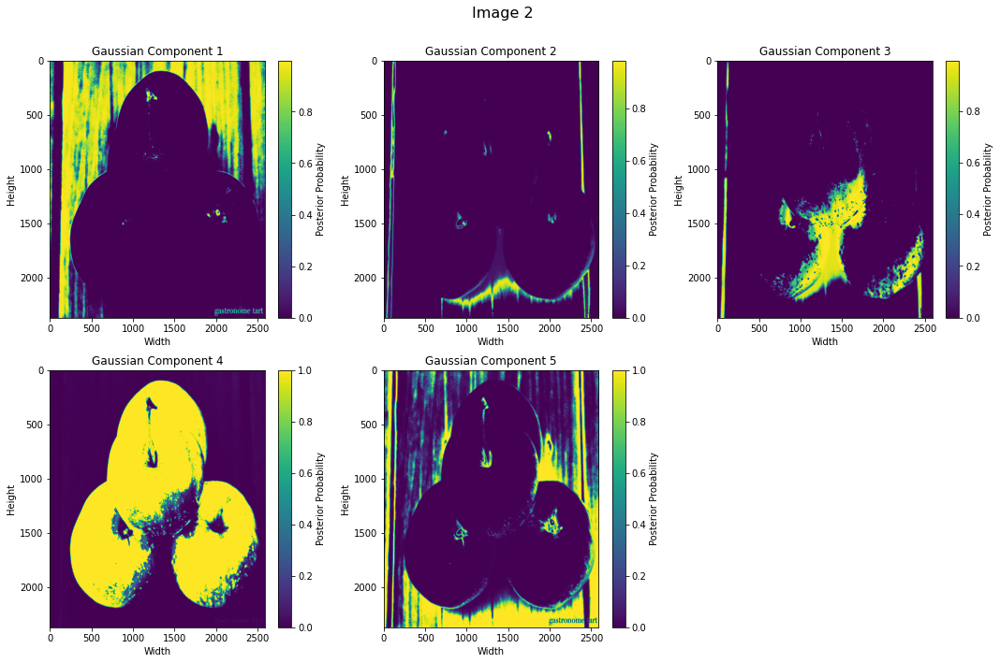

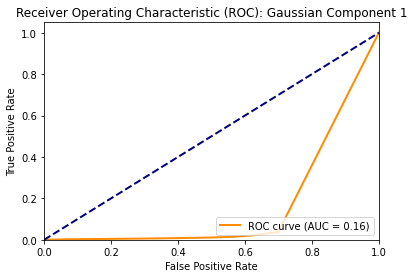

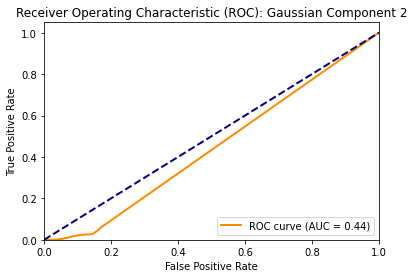

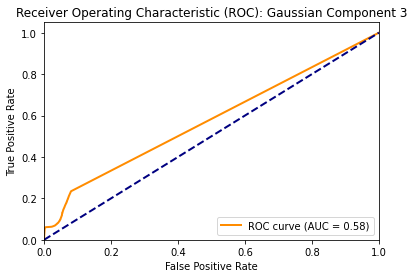

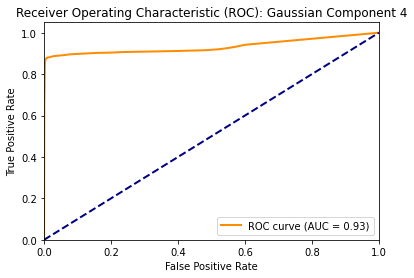

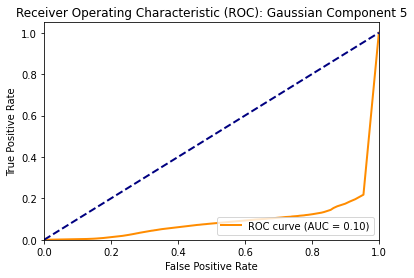

In [437]:
reshape_and_plotposteriors(files_downloaded_test[1],postprob_G5_DownloadedImage2, figure_title =  "Image 2")
calculate_and_plot(true_mask2, postprob_G5_DownloadedImage2[0], custom_thresholds, 1)
calculate_and_plot(true_mask2, postprob_G5_DownloadedImage2[1], custom_thresholds, 2)
calculate_and_plot(true_mask2, postprob_G5_DownloadedImage2[2], custom_thresholds, 3)
calculate_and_plot(true_mask2, postprob_G5_DownloadedImage2[3], custom_thresholds, 4)
calculate_and_plot(true_mask2, postprob_G5_DownloadedImage2[4], custom_thresholds, 5)

## Comments on plots: 

Again, gaussian component 4 models the apples well. The AUC score of 0.93 is high. However is this high AUC score the first indication of overfitting? What components 2 and 3 model has become increasingly opaque compared to the 4 gaussian MoG model. This is an indication of too many gaussian components.  

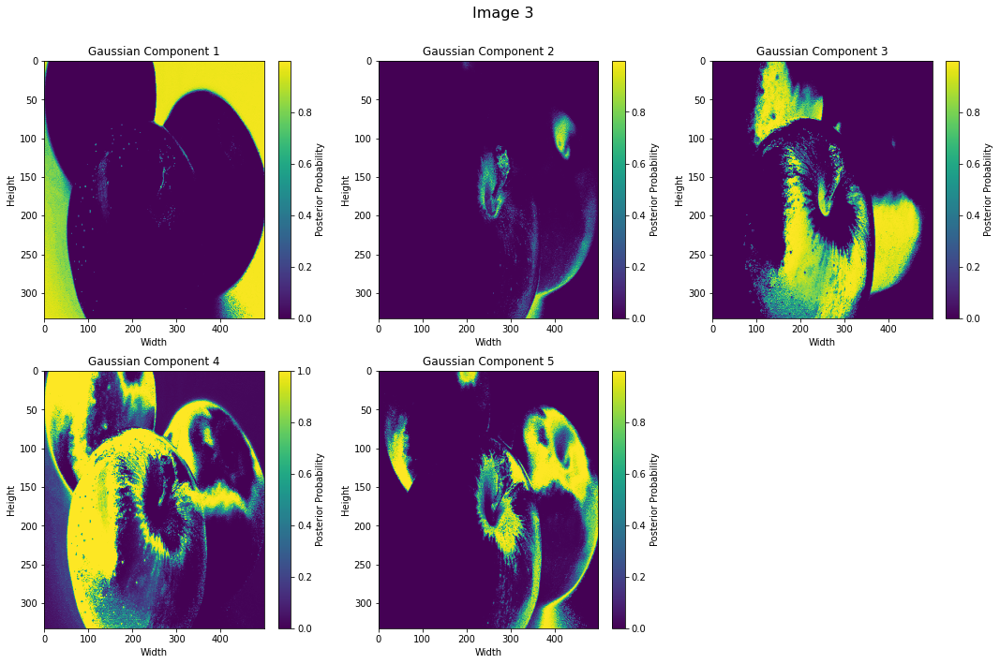

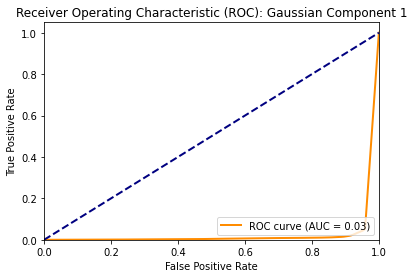

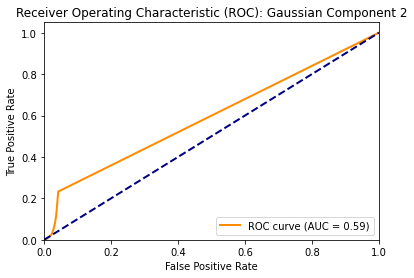

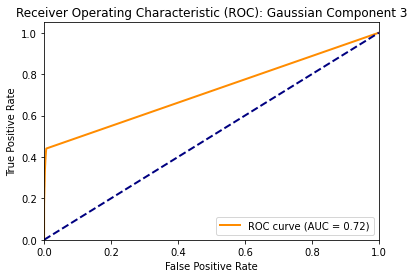

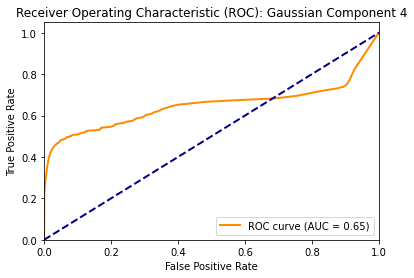

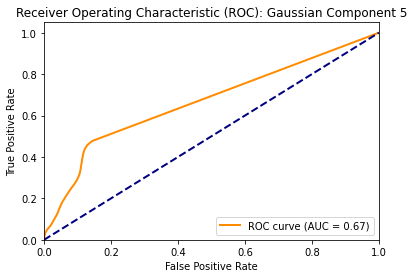

In [438]:
reshape_and_plotposteriors(files_downloaded_test[2],postprob_G5_DownloadedImage3, figure_title =  "Image 3")
calculate_and_plot(true_mask3, postprob_G5_DownloadedImage3[0], custom_thresholds, 1)
calculate_and_plot(true_mask3, postprob_G5_DownloadedImage3[1], custom_thresholds, 2)
calculate_and_plot(true_mask3, postprob_G5_DownloadedImage3[2], custom_thresholds, 3)
calculate_and_plot(true_mask3, postprob_G5_DownloadedImage3[3], custom_thresholds, 4)
calculate_and_plot(true_mask3, postprob_G5_DownloadedImage3[4], custom_thresholds, 5)

## Comments on plots: 

Here it becomes clearer what component 3 atleast models - shadows.  However, again when more shadow is involved in the test image, just as with the previous model with 4 gaussian components it struggles to classify the apple well - reflected in average AUC scores for gaussian components 3 and 4. 

**The Below is code for a plot of the combined data in the RGB space. I have commented it out as it does not add to my conclusions, but you can un-comment it if you would like to have a look at how the pixels are distributed in the RGB space.**

In [552]:

# import plotly.graph_objects as go
# print(combined_data)

# # Number of pixels (assuming the columns represent individual pixels)
# num_pixels = image_3_test.shape[1]

# # x, y, z correspond to R, G, B components for each pixel
# x = image_3_test[0]  # R values
# y = image_3_test[1]  # G values
# z = image_3_test[2]  # B values

# # Create a 3D scatter plot using plotly
# fig = go.Figure(data=[go.Scatter3d(
#     x=x, 
#     y=y, 
#     z=z, 
#     mode='markers',  # Use markers for the points
#     marker=dict(
#         size=5,
#         color=z,  # Color the points by their z-value (B component)
#         colorscale='Viridis',  # Use the 'Viridis' color scale
#         opacity=0.8
#     )
# )])

# fig.update_layout(
#     scene=dict(
#         xaxis_title='R (Red)',
#         yaxis_title='G (Green)',
#         zaxis_title='B (Blue)'
#     ),
#     title='Interactive 3D RGB Scatter Plot',
#     autosize=True
# )

# fig.show()

# Conclusions: 

+ It appears overall, that when training the MoG models on either just apple pixels or all of the pixels (the combined data), the best models, as assessed by ROC-AUC curves and AUC scores are the MoG models with 4 gaussian components. 
+ This is due to high AUC scores (0.97 being the highest), and a good level of interpretability of what the model is actually modelling.
+ For example, there are many different facets to each image of what can be modelled: red apples, green apples, shadows\dark areas, background areas etc... 
+ With the MoG model with 4 gaussian components, it is straightforward (in most cases) to identify what part of the image each component attributes a high posterior probability without losing interpretability. For example, it was often unclear what the MoG model with 5 gaussian components was actually modelling in some cases. 
+ The reason why it is important to know what each gaussian component was modelling is because it offers explainability as to why one model may not be classifying apples as good as one would hope for. An apple with a low amount of shadow may have a very high AUC, but an apple with a high amount of shadow may have a lower AUC score. However, if you can identify clearly which component models shadows, you can seek to create perhaps a combination model which classifies shadows near apples as also apples (this could be an extension to this work perhaps). This would be easier to do if you can clearly identify which gaussian component models shadows which you can do the 4 gaussian component MoG models. 

+ **However**, the main drawback of the MoG model is the nuance in the training data. This MoG model would work very well if the apple and non-apple pixels were clearly distinguished but this is an unrealistic hope. Photos are often affected by lighting. This lighting effect is the downfall of the MoG model in general as the photos with a higher amount of shadow surrounding the apple and on the apple itself typically perform worse than the images where the apple/ apples are in good lighting. 



## Why we would be using a *training set, and a validation set, and a test set* as opposed to just a *training set, and a test set* 
    


The validation set in the context of a Mixture of Gaussians (MoG) model is a separate subset of data that is used to tune hyperparameters and select the best model configuration during the training process, without directly influencing the final model evaluation. 

In this case, for classifying apples, the validation set plays a crucial role in optimizing the number of Gaussian components in the model, ensuring that the mixture captures the complex, multimodal nature of the data (e.g., different apple colors, textures, backgrounds, shadows etc...). By evaluating the MoG model on the validation set, we can identify the optimal balance between model complexity and generalization, avoiding both underfitting (where the model is too simple to capture the data's complexity) and overfitting (where the model becomes too tailored to the training data and fails to generalize). In addition, the validation set helps prevent the model from memorizing patterns that are specific to the training set, allowing it to generalize better to unseen apple images, ensuring robust performance on the final test set.


# N.B. 

For the model below, I have changed the line: 

logLike += np.log(np.finfo(float).eps)  # Small epsilon to avoid log(0)

to:
           
logLike += np.log(1e-80)

in the getMixGaussLogLike function. 

However, this has appeared to not make a difference in the performance of the model as displayed below. 

In [550]:
apple_mog_model_new = fitMixGauss(combined_data, 2)


Log Likelihood Iter 0 : -158817618.019

Log Likelihood After Iter 0 : -12853114.156

Estimated time remaining: 2429.80 seconds
Log Likelihood After Iter 1 : -12833299.741

Estimated time remaining: 2287.03 seconds
Log Likelihood After Iter 2 : -12783290.654

Estimated time remaining: 2186.96 seconds
Log Likelihood After Iter 3 : -12699097.703

Estimated time remaining: 2106.86 seconds
Log Likelihood After Iter 4 : -12624661.728

Estimated time remaining: 2023.96 seconds
Log Likelihood After Iter 5 : -12586428.041

Estimated time remaining: 1937.56 seconds
Log Likelihood After Iter 6 : -12568519.553

Estimated time remaining: 1852.93 seconds
Log Likelihood After Iter 7 : -12556875.785

Estimated time remaining: 4661.93 seconds
Log Likelihood After Iter 8 : -12547038.844

Estimated time remaining: 4152.97 seconds
Log Likelihood After Iter 9 : -12538284.392

Estimated time remaining: 7169.80 seconds
Log Likelihood After Iter 10 : -12530882.250

Estimated time remaining: 6336.30 seconds
Lo

Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%
Progress: 10.00%
Progress: 20.00%
Progress: 30.00%
Progress: 40.00%
Progress: 50.00%
Progress: 60.00%
Progress: 70.00%
Progress: 80.00%
Progress: 90.00%
Progress: 100.00%


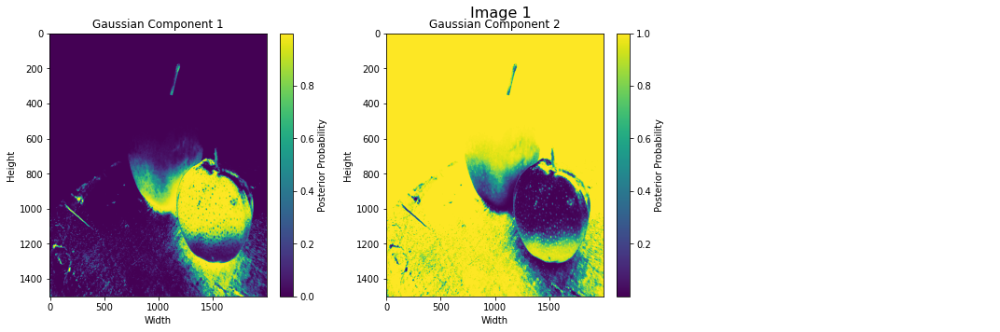

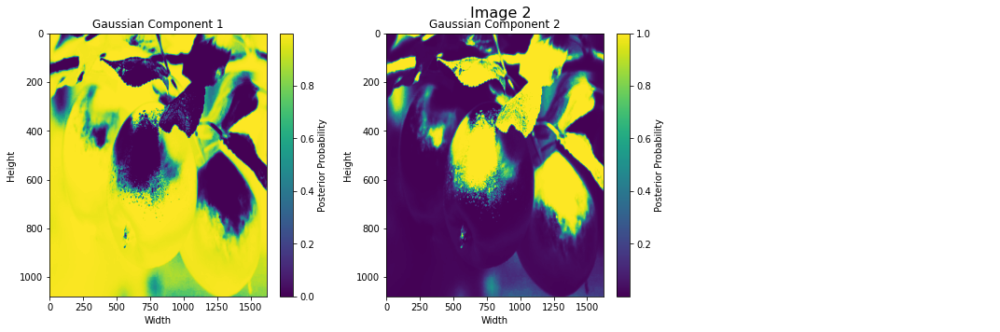

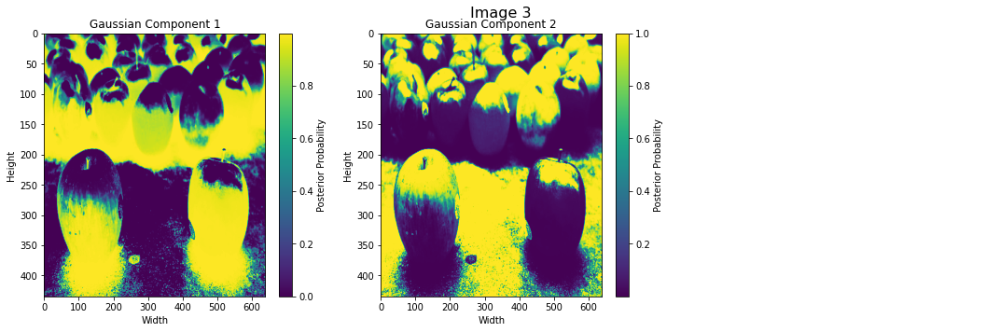

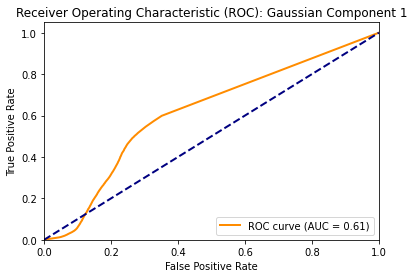

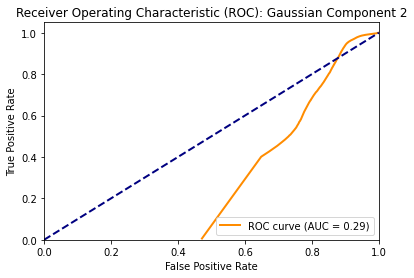

In [551]:
postprob_new1 = getPosteriorProbabilities(image_1_test, apple_mog_model_new)
postprob_new2 = getPosteriorProbabilities(image_2_test, apple_mog_model_new)
postprob_new3 = getPosteriorProbabilities(image_3_test, apple_mog_model_new)

reshape_and_plotposteriors(files_test[0],postprob_new1, figure_title =  "Image 1")
reshape_and_plotposteriors(files_test[1],postprob_new2, figure_title =  "Image 2") 
reshape_and_plotposteriors(files_test[2],postprob_new3, figure_title =  "Image 3")

calculate_and_plot(true_mask, postprob_new1[0], custom_thresholds, 1)
calculate_and_plot(true_mask, postprob_new1[1], custom_thresholds, 2)